# Sample alignment

This tutorial describes the steps that are taken to perform sample alignment near the beginning of a beam time.  It also allows viewing raw data from scans.  For more detailed data reduction and analysis, see other notebooks.

## Imports and other setup

Before using this notebook, ensure that python has been set up correctly (e.g., https://github.com/NSLS-II-SST/rsoxs_workflow/blob/Issue46_PythonSetupExample_Draft/examples/setup_python_miniforge.md)

### Import PyHyperScattering and other libraries as needed

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

import PyHyperScattering as phs
print(f'Using PyHyper Version: {phs.__version__}')

import sys
print(f"Python version {sys.version}.  Version info. {sys.version_info}")
import os

## Data storage and manipulation
import numpy as np
import pandas as pd
import xarray as xr ## !pip install xarray==2022.3
import zarr
import json
import math
import copy
import datetime
import inspect
import re
import scipy

## Plotting
import matplotlib.pyplot as plt
import matplotlib
from matplotlib.colors import LogNorm ## For log scaling in imshow
from matplotlib.pyplot import cm
import matplotlib.dates as mdates
import matplotlib as mpl
from matplotlib.colors import ListedColormap,LinearSegmentedColormap
from matplotlib.colors import Normalize
import matplotlib.patches as patches
from matplotlib.path import Path

## Image processing
from PIL import Image

C:\Users\pmk\AppData\Local\miniforge3\envs\20250614_1\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
  File "C:\Users\pmk\AppData\Local\miniforge3\envs\20250614_1\Lib\runpy.py", line 198, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "C:\Users\pmk\AppData\Local\miniforge3\envs\20250614_1\Lib\runpy.py", line 88, in _run_code
    exec(code, run_globals)
  File "C:\Users\pmk\AppData\Local\miniforge3\envs\20250614_1\Lib\site-packages\ipykernel_launcher.py", line 18, in <module>
    app.launch_new_instance()
  File "C:\Users\pmk\AppData\Local\miniforge3\envs\20250614_1\Lib\site-packages\traitlets\config\application.py", line 1075, in launch_instance
    app.start()
  File "C:\Users\pmk\AppData\Local\miniforge3\envs\20250614_1\Lib\site-packages\ipykernel\kernelapp.py", line 739, in start


Using PyHyper Version: 0.2.9+33.gab928ef
Python version 3.12.10 | packaged by conda-forge | (main, Apr 10 2025, 22:08:16) [MSC v.1943 64 bit (AMD64)].  Version info. sys.version_info(major=3, minor=12, micro=10, releaselevel='final', serial=0)


### Load local functions

Below are some functions that can assist data viewing and processing.  On the right-hand panel, select the table of contents, right click on the "Load local functions" heading, and click on "Select and Run Cell(s) for this Heading"

#### Spreadsheet loading and saving

In [2]:
## Pasted from https://github.com/usnistgov/sst-rsoxs/blob/main/rsoxs/configuration_setup/configuration_load_save_sanitize.py

import os
import numpy as np
import pandas as pd
import ast
import copy
import json
import datetime
import re, warnings, httpx
import uuid

#from ..plans.default_energy_parameters import energy_list_parameters
energy_list_parameters = {
    "carbon_NEXAFS":  (250, 1.28, 282, 0.3, 297, 1.325, 350), 
    "nitrogen_NEXAFS":  (370, 1, 397, 0.2, 407, 1, 440),
    "oxygen_NEXAFS":  (500, 1, 525, 0.2, 540, 1, 560),
    "fluorine_NEXAFS":  (650, 1.5, 680, 0.25, 700, 1.25, 740),
    "magnesium_RSoXS":  (1250, 2.5, 1300, 0.5, 1330, 2.5, 1430),
    "aluminum_NEXAFS":  (1540, 1.25, 1560, 0.25, 1580, 2, 1600),
    "silicon_NEXAFS":  (1820, 1.25, 1840, 0.25, 1860, 1.25, 1910),
    "sulfurL_NEXAFS":  (150, 1, 160, 0.1, 170, 1, 200),
    "calciumL_NEXAFS":  (320, 1, 345, 0.1, 355, 1, 380),
    "ironL_NEXAFS":  (680, 2, 700, 0.3, 730, 2, 780),
    "zincL_NEXAFS":  (1000, 1.5, 1015, 0.25, 1035, 1.25, 1085),

    "carbon_NEXAFS_WSU":  (270, 1, 278, 0.5, 283, 0.05, 291.5, 0.5, 300, 1, 330, 4, 350), ## WSU NEXAFS for Brian Collins group
    "carbon_NEXAFS_Slow":  (250, 0.25, 282, 0.1, 297, 0.25, 350),

    "carbon_RSoXS":  (250, 5, 270, 1, 282, 0.1, 287, 0.2, 292, 1, 305, 5, 350),
    "nitrogen_RSoXS":  (380, 0.25, 397, 0.1, 407, 0.3, 440),
    "oxygen_RSoXS":  (510, 1.5, 525, 0.15, 540, 2, 560),
    "fluorine_RSoXS":  (670, 2, 680, 0.2, 690, 0.5, 700, 1.6, 740),
    "magnesium_RSoXS":  (1250, 5, 1300, 0.4, 1330, 4, 1430),
    "aluminum_RSoXS":  (1540, 2, 1560, 0.2, 1580, 2, 1600),
    "silicon_RSoXS":  (1820, 2.5, 1840, 0.2, 1860, 2, 1910),
    "sulfurL_RSoXS":  (150, 1.25, 160, 0.1, 170, 1.25, 200),
    "calciumL_RSoXS":  (320, 2, 340, 0.5, 345, 0.2, 349, 0.05, 349.5, 0.1, 352.5, 0.05, 353, 0.5, 355, 0.5, 360, 0.2, 380),
    "ironL_RSoXS":  (680, 2.5, 700, 0.3, 730, 2.5, 780),
    "zincL_RSoXS":  (1000, 2.5, 1015, 0.2, 1035, 2, 1085),
}



def load_configuration_spreadsheet_local(file_path):
    ## TODO: use natsort to get things in order of bar location

    ## The following are items that were present in Eliot's spreadsheet loader, but I might not keep going forward.
    ## Eliot sets a version number for the Excel file and checks for this.  Not sure if this is necessary, because if anyone incorrectly changes anything, then it would still be wrong?
    ## Also, Eliot has the top few rows with instructions, but I might leave that aside for now.
    ## Most probably getting rid of the Parameter/Index

    ## Load list of samples and metadata, make a configuration dictionary, and sanitize
    samplesDF = pd.read_excel(file_path, sheet_name="Samples")
    samplesDF = sanitizeSpreadsheet(samplesDF)
    configuration = samplesDF.to_dict(orient="records")
    configuration = sanitizeSamples(configuration)

    ## Load list of acquisitions, make a dictionary, and sanitize
    acquisitionsDF = pd.read_excel(file_path, sheet_name="Acquisitions")
    acquisitionsDF = sanitizeSpreadsheet(acquisitionsDF)
    acquisitionsDict = acquisitionsDF.to_dict(orient="records")
    acquisitionsDict = sanitizeAcquisitions(acquisitionsDict, configuration)

    ## Store acquisitions into its respective sample dictionary.  Consider making this a separate function so that dictionaries written directly in Bluesky can be fed into this function.
    for indexAcquisition, acquisition in enumerate(acquisitionsDict):
        configuration = updateConfigurationWithAcquisition(configuration, acquisition)

    return configuration


def sanitizeSpreadsheet(df):
    """
    Sanitize spreadsheet data by converting strings to appropriate Python types.

    Parameters
    ----------
    df : pandas.DataFrame
        DataFrame containing configuration data

    Returns
    -------
    pandas.DataFrame
        Sanitized DataFrame
    """
    
    # Define type conversion functions
    def safe_eval(val):
        if val is None:
            return None
        if isinstance(val, (bool, int, float)):
            return val
        try:
            ## Lists, etc. will get imported as strings, so need to convert to the intended data type.
            # Handle string representations of Python literals
            return ast.literal_eval(str(val))
        except (ValueError, SyntaxError) as e:
            # If not a Python literal, return as is
            print(f"Error evaluating {val}: {e}")
            return val

    # List of columns that should remain as strings
    ## TODO: energy_list_parameters is sometimes a string or sometimes a list.  Figure out a way to handle that.
    string_columns = [
        "location",
        "bar_loc",
        "acq_history",
        "acquire_status",
        "sample_id",
        "sample_name",
        "sample_state",
        "sample_set",
        "project_name",
        "project_desc",
        "institution",
        "configuration_instrument",
        "scan_type",
        "polarization_frame",
        "group_name",
        "uid_local",
        "notes",
        "proposal_id",
        "bar_spot",
        "notes",
        "bar_name",
    ]

    # Process each column
    for column in df.columns:
        if column in string_columns:
            continue

        try:
            df[column] = df[column].apply(safe_eval)
        except Exception as e:
            print(f"Error processing column {column}: {e}")
            continue
    
    
    ## Blank cells are loaded as nan by default.  Replace with None.
    ## Need this line at the end rather than the beginning because the above sanitization somehow turns None back into NaN
    df = df.replace({np.nan: None})
    
    return df


## TODO: For now, I am keeping Sample/Bar parameters exactly the same as how Eliot had them, but I would like to refactor these later on.
sampleParameters_Empty = {
    "bar_name": None,  ## TODO: Would like to eliminate in the future
    "sample_id": None,  ## TODO: Would like to rename to sampleID
    "sample_name": None,  ## TODO: Would like to eliminate and consolidate with sample_id
    "project_name": None,
    "institution": None,
    "proposal_id": None,
    "bar_spot": None,
    "front": None,
    "grazing": None,
    "angle": None,  ## TODO: Would like to refactor so that there is a single angle definition
    "height": None,  ## Required for now to get z offset
    "sample_priority": None,  ## TODO: Would like to eliminate, becasue in practice, Acquisitions priority is what matters
    "notes": None,
    "location": None,
    "bar_loc": None,
}
samplesParameters_Required = [
    "bar_name",
    "sample_id",
    "sample_name",
    "project_name",
    "institution",
    "proposal_id",
    "bar_spot",
    "front",
    "grazing",
    "angle",
    "height",
    "sample_priority",
]
## TODO: I want to have a notes parameter, but not as a required parameter
samplesParameters_Strings = [
    "bar_name",
    "sample_id",
    "sample_name",
    "project_name",
    "institution",
    "bar_spot",
]
samplesParameters_Booleans = [
    "front",
    "grazing",
]
samplesParameters_Ints = [
    "proposal_id",
    "sample_priority",
]


def sanitizeSamples(configurationInput):
    configuration = copy.deepcopy(configurationInput)
    for indexSample, sample in enumerate(
        copy.deepcopy(configuration)
    ):  ## Making a copy so that I am not changing the configuration that I am iterating over

        ## There were a couple options on how to handle this:
        ## 1) Have a template, and make sure spreadsheets adhere exactly to that template.
        ## 2) Have some required parameters, but otherwise, users can have additional columns of their choosing.
        ## I am opting for option 2 becuase this way, users can decide what metadata matters to them and how they want to organize it.
        """
        ## Convert nan to None
        for indexParameter, parameter in enumerate(list(sample.keys())):
            if isinstance(sample[parameter], float):
                if np.isnan(sample[parameter]): configuration[indexSample][parameter] = None
        """
        ## Check that required parameters exist
        ## For a spreadsheet, this would probably be more efficient to check once when the spreadsheet is loaded rather than one-by-one for each sample.  But it is good to have in case sample configuration is loaded as dictionary directly in Bluesky rather than using spreadsheet.
        for indexParameter, parameter in enumerate(samplesParameters_Required):
            if sample.get(parameter, "Not present") == "Not present":
                raise KeyError(
                    parameter
                    + " is a required parameter.  Please add "
                    + parameter
                    + " parameter with an appropriate value."
                )

        ## Then sanitize required parameters further to make sure they are correct type, value, etc.
        for indexParameter, parameter in enumerate(samplesParameters_Strings):
            if not isinstance(sample[parameter], str):
                raise ValueError(parameter + " for row " + str(indexSample) + " must be a string")
        for indexParameter, parameter in enumerate(samplesParameters_Booleans):
            if not isinstance(sample[parameter], bool):
                raise ValueError(parameter + " for row " + str(indexSample) + " must be TRUE or FALSE")
        for indexParameter, parameter in enumerate(samplesParameters_Ints):
            if (not isinstance(sample[parameter], int)) or (sample[parameter] < 0):
                raise ValueError(parameter + " for row " + str(indexSample) + " must be a positive integer")
        ## If sample angles are invalid, default to normal incidence
        if sample["grazing"]:
            if (not isinstance(sample["angle"], (float, int))) or (sample["angle"] < 20) or (sample["angle"] > 90):
                print("Invalid angle.  Defaulting to normal incidence.")
                configuration[indexSample]["angle"] = 90
        if not sample["grazing"]:
            if (
                (not isinstance(sample["angle"], (float, int)))
                or (sample["angle"] < -14)
                or (sample["angle"] > 90)
            ):
                print("Invalid angle.  Defaulting to normal incidence.")
                configuration[indexSample]["angle"] = 0
        if not (sample["height"] >= 0):
            raise ValueError("Sample height in row " + str(indexSample) + " must be 0 or larger.")

        ## Sanitize location and acquisition history
        ## This is mostly copied from Eliot's code without much reorganization
        if copy.deepcopy(sample).get("location", "Not present") == "Not present" or sample["location"] is None:
            configuration[indexSample]["location"] = "[]"
        configuration[indexSample]["location"] = json.loads(
            copy.deepcopy(configuration[indexSample]).get("location", "[]").replace("'", '"')
        )
        if copy.deepcopy(sample).get("bar_loc", "Not present") == "Not present" or sample["bar_loc"] is None:
            configuration[indexSample][
                "bar_loc"
            ] = "{}"  ## TODO: need a better name, such as location_relative.  bar_loc stores information from bar image and offset values.
        configuration[indexSample]["bar_loc"] = json.loads(
            copy.deepcopy(configuration[indexSample]).get("bar_loc", "{}").replace("'", '"')
        )
        if (
            copy.deepcopy(sample).get("acq_history", "Not present") == "Not present"
            or sample["acq_history"] is None
        ):
            configuration[indexSample]["acq_history"] = "[]"
        configuration[indexSample]["acq_history"] = json.loads(
            copy.deepcopy(configuration[indexSample])
            .get("acq_history", "[]")
            .replace("'", '"')
            .rstrip('\\"')
            .lstrip('\\"')
        )

        ## These parts are copied from Eliot's code
        configuration[indexSample]["bar_loc"]["spot"] = sample["bar_spot"]
        configuration[indexSample]["bar_loc"]["th"] = sample["angle"]
        ## Eliot: Get rid of the stupid unnamed columns thrown in by pandas
        for key in [key for key, value in sample.items() if "named" in key.lower() or "Index" in key]:
            del configuration[indexSample][key]

        ## TODO: In the future, might want to have this more flexible, so users could add acquisitions to this dictionary and feed it in directly through Bluesky, but for now, acquisitions have to be entered separately
        configuration[indexSample]["acquisitions"] = []

        ## Adding in non-essential parameters so that they show up
        if sample.get("notes", "Not present") == "Not present":
            configuration[indexSample]["notes"] = ""

    return configuration




## TODO: not complete, add more sanitization here.  Check Eliot's code for anything I might want to add.
## TODO: import this into rsoxs scans and set those as defaults in the functions so that the defaults are decided in one root place
acquisitionParameters_Default = {
    "sample_id": None,
    "configuration_instrument": "",
    "scan_type": "",
    "energy_list_parameters": 150,
    "polarization_frame": "lab",
    "polarizations": [0],
    "exposure_time": 1,
    "exposures_per_energy": 1,
    "cycles": 0,
    "sample_angles": [0],
    "spiral_dimensions": None,  ## default for spirals is [0.3, 1.8, 1.8], [step_size, diameter_x, diameter_y], useful if our windows are rectangles, not squares
    "group_name": "Group",
    "priority": 1,
    "acquire_status": "Not begun",
    "uid_local": None,  ## Intended so that I can store updates back into this same acquisition
    "notes": None,
}
## TODO: would like a cycles-like parameter where I can sleep up and down in energy.  Lucas would want that.
## TODO: maybe name the above as acquisitionParameters_Blank and then have a different acquisitionParameters_Default with the default values that I would liek to enter into the scan functions

def sanitizeAcquisitions(acquisitionsInput, configuration):
    acquisitions = copy.deepcopy(acquisitionsInput)

    sampleIDs = [sample["sample_id"] for sample in configuration]

    for indexAcquisition, acquisition in enumerate(copy.deepcopy(acquisitions)):
        if acquisition["sample_id"] not in sampleIDs:
            raise ValueError("sample_id " + str(acquisition["sample_id"]) + " in Acquisitions row " + str(indexAcquisition) + " was not found in Samples list")
        
        acquisitions[indexAcquisition] = sanitizeAcquisition(acquisition)
    

    return acquisitions


def sanitizeAcquisition(acquisitionInput):
    acquisition = copy.deepcopy(acquisitionInput)
    ## Sanitize general parameters
    for indexParameter, parameter in enumerate(list(acquisitionParameters_Default.keys())):
        if (
            copy.deepcopy(acquisition).get(parameter, "Not present") == "Not present"
            or acquisition[parameter] is None
            # or acquisition[parameter]==""
        ):
            acquisition[parameter] = acquisitionParameters_Default[parameter]
    

    ## TODO: would like to find a way to automate configurations list
    parameterName = "configuration_instrument"
    if acquisition[parameterName] not in ("NoBeam",
                                        "WAXS_OpenBeamImages",
                                        "WAXSNEXAFS",
                                        "WAXS",
                                        "WAXS_LowFlux",
                                        "WAXSNEXAFS_Liquids",
                                        "WAXS_Liquids",
                                        ):
        raise ValueError("Please enter valid " + str(parameterName))

    parameterName = "polarization_frame"
    if acquisition[parameterName] not in ("lab", "sample"): raise ValueError("Please enter valid " + str(parameterName))

    for parameterName in ["polarizations", "sample_angles"]:
        if isinstance(acquisition[parameterName], (int, float)):
            acquisition[parameterName] = [acquisition[parameterName]]
        if not isinstance(acquisition[parameterName], (list, tuple)): raise ValueError("Please enter valid " + str(parameterName))
        else:
            for angle in acquisition[parameterName]:
                if parameterName == "polarizations":
                    if not (angle == -1
                            or (0 <= angle <= 180)):
                        raise ValueError("Please enter valid " + str(parameterName))
                if parameterName == "sample_angles":
                    temp = 0 ## TODO: replace placeholder with something meaningful
                    ## TODO: need better way to deal with Sample tab entries.  Probably need to have configuration as an input
                    ## TODO: on a broader level, probably want to remove angle from bar entry and only have it in acquisitions
            
    
    parameterName = "exposure_time"
    if not isinstance(acquisition[parameterName], (int, float)): raise TypeError(str(parameterName) + " must be a single number.")
    elif acquisition[parameterName] < 0.001 or acquisition[parameterName] > 10: raise ValueError(str(parameterName) + " must be between 0.001 and 10 s.")

    parameterName = "exposures_per_energy"
    acquisition[parameterName] = int(acquisition[parameterName])

    parameter_name = "cycles"
    if acquisition[parameter_name] < 0: raise ValueError(str(parameter_name) + " must be a positive integer.")
    ## Spreadsheet will default to float value, so we have to check for both int and float and then convert float to int.
    if not isinstance(acquisition[parameter_name], (int, float)): raise ValueError(str(parameter_name) + " must be a positive integer.")
    acquisition[parameter_name] = int(acquisition[parameter_name])

    parameterName = "priority"
    if not isinstance(acquisition[parameterName], (int, float)): raise TypeError(str(parameterName) + " must be an integer.")
    
    
    ## Sanitize parameters for specific scan types
    parameterName = "scan_type"
    if acquisition[parameterName] in ("time", "time2D"):
        acquisition = sanitizeTimeScan(acquisition)
    elif acquisition[parameterName] == "spiral":
        acquisition = sanitizeSpirals(acquisition)
    elif acquisition[parameterName] in ("nexafs", "rsoxs"):
        acquisition = sanitizeEnergyScan(acquisition)
    else: raise ValueError("Please enter valid " + str(parameterName))

    ## Adding a local UID (not the same as Tiled's UID) so that I can identify this scan when I want to update it with data while it is running like acquireStatus
    if (
        copy.deepcopy(acquisition).get("uid_local", "Not present") == "Not present"
        or acquisition["uid_local"] is None
    ):
        acquisition["uid_local"] = uuid.uuid4()

    return acquisition


def sanitizeTimeScan(acquisitionInput):
    acquisition = copy.deepcopy(acquisitionInput)
    parameter = "energy_list_parameters"
    if not (
        isinstance(acquisition[parameter], (float, int))
    ):
        raise TypeError(str(parameter) + " must be a single number.")

    return acquisition


def sanitizeSpirals(acquisitionInput):
    acquisition = copy.deepcopy(acquisitionInput)
    parameter = "energy_list_parameters"
    if not (isinstance(acquisition[parameter], (float, int))):
        raise TypeError(str(parameter) + " must be a single number.")

    parameterName = "spiral_dimensions"
    if acquisition[parameterName] is None:
        acquisition[parameterName] = [0.3, 1.8, 1.8]
    elif not isinstance(acquisition[parameterName], (list, tuple)):
        raise TypeError(str(parameterName) + " must be a list.")
    elif len(acquisition[parameterName]) != 3:
        raise ValueError(
            f"spiral_dimensions must have 3 elements, got {acquisition[parameterName]} with length {len(acquisition[parameterName])}"
        )

    return acquisition


def sanitizeEnergyScan(acquisitionInput):
    acquisition = copy.deepcopy(acquisitionInput)
    ## TODO: Most of the sanitization here can be reused for rsoxs scans.  This then would get called in sanitizeAcquisitions.
    parameterName = "energy_list_parameters"
    if acquisition[parameterName] is None: raise ValueError("Please enter valid " + str(parameterName))
    if isinstance(acquisition[parameterName], (float, int)):
        acquisition[parameterName] = (
            acquisition[parameterName],
            acquisition[parameterName],
            0,
        )
    if isinstance(acquisition[parameterName], str):
        if acquisition[parameterName] not in list(energy_list_parameters.keys()):
            raise ValueError("Please enter valid energy plan.")

    return acquisition


## TODO: Philosophical question: is dry running necessary if any errors can be captured through sanitization?
## It is still important to generate time estimates, but that could be separate.
## One of the features of dry running in the old code was that it could indicate if something might fall out of a motor range.  But if that is documented and hard-coded and sanitized here, that might be better?


def sortAcquisitionsQueue(acquisitions, sortBy=["priority"]):
    queue = []
    for indexAcquisition, acquisition in enumerate(copy.deepcopy(acquisitions)):
        ## Acquisitions that should not be added to queue
        if "Finished" in acquisition["acquire_status"]: continue ## Don't rerun scans that are completed.
        if acquisition["scan_type"] == "spiral":
            ## If a good spot is found before the spiral scan is complete, can pause the queue.  Once the queue is resumed, a started spiral scan will get skipped.
            if "Started" in acquisition["acquire_status"]: continue
        
        queue.append(acquisition)

    for indexSortingCriterion, sortingCriterion in enumerate(sortBy):
        if sortingCriterion == "priority":
            queue = sorted(queue, key=lambda x: x["priority"])

    return queue


def updateConfigurationWithAcquisition(configurationInput, acquisitionInput):
    configuration = copy.deepcopy(configurationInput)
    acquisition = copy.deepcopy(acquisitionInput)
    ## When I run scans, I will be updating the acquireStatus among other things.  I want to feed the updated acquisition dictionary back into the main configuration

    for indexSample, sample in enumerate(copy.deepcopy(configuration)):
        if sample["sample_id"] == acquisition["sample_id"]:
            configurationUpdated = False
            for indexAcquisitionExisting, acquisitionExisting in enumerate(
                configuration[indexSample]["acquisitions"]
            ):
                ## If there already is an acquisition with the same uid_Local, update that acquisition
                if acquisitionExisting["uid_local"] == acquisition["uid_local"]:
                    configuration[indexSample]["acquisitions"][indexAcquisitionExisting] = acquisition
                    configurationUpdated = True
                    break
            ## If this acquisition does not exist in the configuration, add it to the list
            if not configurationUpdated:
                configuration[indexSample]["acquisitions"].append(acquisition)
            break

    return configuration


def save_configuration_spreadsheet_local(configuration, file_path, file_label=""):

    ## TODO: undecided if I want to sanitize anything here or just faithfully save what is in rsoxs_config and can let load_sheet deal with all sanitization
    ## I think probably erring on the side of less sanitization here is better so that users can save something and investivate what might be the issue.

    ## Take acquisitions from the configuration and gather into a list of dictionaries to save as separate Acquisitions sheet
    ## If the parameters are not transferred to the template dictionary, they might show up in a different order in the spreadsheet.
    ## Then delete ["acquisitions"] key from each sample
    configurationCopy = copy.deepcopy(configuration)
    acquisitions_ToExport = gatherAcquisitionsFromConfiguration(configurationCopy)
    for indexSample, sample in enumerate(copy.deepcopy(configurationCopy)):
        del configurationCopy[indexSample]["acquisitions"]

    ## Organize sample parameters into the correct order
    samples_ToExport = []
    for indexSample, sample in enumerate(copy.deepcopy(configurationCopy)):
        sample_ToExport = copy.deepcopy(sampleParameters_Empty)
        ## Copy over core parameters
        for indexParameter, parameter in enumerate(list(sampleParameters_Empty.keys())):
            if sample.get(parameter, "Not present") == "Not present":
                sample_ToExport[parameter] = None
            else:
                sample_ToExport[parameter] = sample[parameter]
        ## Copy over extra parameters that users may have defined beyond my codebase
        extraParameters = set(sample.keys()) - set(sampleParameters_Empty.keys())
        for indexParameter, parameter in enumerate(extraParameters):
            if sample.get(parameter, "Not present") == "Not present":
                sample_ToExport[parameter] = None
            else:
                sample_ToExport[parameter] = sample[parameter]
        samples_ToExport.append(sample_ToExport)

    ## TODO: for now, I am not including acq_history becuase I need to understand it better.  Anyways, my plans don't save acq_history so not needed urgently.

    ## Export file
    timeStamp = datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
    fileName = "out_" + str(timeStamp) + "_" + str(file_label) + ".xlsx"
    acquisitions_ToExport_df = pd.DataFrame.from_dict(acquisitions_ToExport, orient="columns")
    samples_ToExport_df = pd.DataFrame.from_dict(samples_ToExport, orient="columns")

    writer = pd.ExcelWriter(os.path.join(file_path, fileName))
    samples_ToExport_df.to_excel(writer, index=False, sheet_name="Samples")
    acquisitions_ToExport_df.to_excel(writer, index=False, sheet_name="Acquisitions")
    writer.close()


def gatherAcquisitionsFromConfiguration(configuration):
    
    acquisitions_ToGather = []
    for indexSample, sample in enumerate(copy.deepcopy(configuration)):
        for indexAcquisition, acquisition in enumerate(sample["acquisitions"]):
            acquisition_ToGather = copy.deepcopy(
                acquisitionParameters_Default
            )  ## Need to define here rather than outside loop or else a shallow copy gets overwritten and makes duplicates of the last acquisition
            for indexParameter, parameter in enumerate(list(acquisitionParameters_Default.keys())):
                if acquisition.get(parameter, "Not present") == "Not present":
                    acquisition_ToGather[parameter] = None
                else:
                    acquisition_ToGather[parameter] = acquisition[parameter]
            acquisitions_ToGather.append(acquisition_ToGather)
    
    
    return acquisitions_ToGather








def get_sample_dictionary_nbs_format_from_rsoxs_config(configuration):
    """
    Converts list of samples from the format used in rsoxs_config to that used by nbs-bl's manipulator object.
    """

    bar_dict = {}
    for sample_dict in configuration:
        sample_id = sample_dict.pop("sample_id")
        sample_dict["name"] = sample_dict.get("sample_name", "")
        location = sample_dict.get("location")
        coordinates = []
        for key in ["x", "y", "z", "th"]:
            for loc in location:
                if loc.get("motor") == key:
                    coordinates.append(loc.get("position"))
                    break
        if len(coordinates) != 4:
            ## Before picking sample locations from bar image, the spreadsheet does not have sample locations.
            ## Workaround for now is to skip these samples.
            #raise ValueError(f"Sample {sample_dict['name']} has {len(coordinates)} positions, expected 4")
            print(f"Sample {sample_dict['name']} has {len(coordinates)} positions, expected 4.  Not including this sample in nbs-bl's manipulator.")
        else:
            sample_dict["position"] = {"coordinates": coordinates}
            sample_dict["origin"] = "absolute"
            sample_dict["description"] = sample_dict.get("sample_desc", "")
            bar_dict[sample_id] = sample_dict
    
    return bar_dict

#### Stich sample

In [3]:
## Originally from rsoxs.alignment.bar_image_processing import stitch_sample
## TODO: rename function to stitch_sample_bar_image?
def stitch_sample(images, step_size, y_off, from_image=None, flip_file=False):
    global sample_image_axes

    if isinstance(from_image, str):
        im_frame = Image.open(from_image)
        result = np.array(im_frame)
        if flip_file:
            result = np.flipud(result)
    else:
        pixel_step = int(step_size * (1760) / 25)
        pixel_overlap = 2464 - pixel_step
        result = images[0][0]
        i = 0
        for imageb in images[1:]:
            image = imageb[0]
            i += 1
            if y_off > 0:
                result = np.concatenate((image[(y_off * i) :, :], result[:-(y_off), pixel_overlap:]), axis=1)
            elif y_off < 0:
                result = np.concatenate((image[: (y_off * i), :], result[-(y_off):, pixel_overlap:]), axis=1)
            else:
                result = np.concatenate((image[:, :], result[:, pixel_overlap:]), axis=1)
        # result = np.flipud(result)

    fig, ax = plt.subplots()
    ax.imshow(result, extent=[-210, 25, -14.5, 14.5])
    sample_image_axes = ax
    #fig.canvas.mpl_connect("button_press_event", plot_click) ## For now, want to keep simple and not do clicking here.
    #fig.canvas.mpl_connect("key_press_event", plot_key_press)
    plt.show()
    return result


## TODO: try clicking on spots in notebook instead of RSoXS control computer

## TODO: try running correct_bar in notebook instead of RSoXS control computer



#### Fiducial calibration

In [4]:
def view_fiducial_scans(
    scan_id_start,
    maxima = np.full(10, np.nan),
):
    """
    View fiducial scans and optionally the calculated peak maxima.

    Args:
        scan_id_start: int
            Scan ID for the first fiducial scan in the scan series.
        maxima: list of 10 float values
            Optional list of peak maxima found by Bluesky that can be overlaid onto the fiducial scan plots.
            If no list is provided, default is a list of nan, which does not show up on the plot.

    Returns: 
        Plots of each fiducial scan.

    Raises:

    Examples:
    """

    x_lookup = [
                "solid_sample_y",
                "solid_sample_x",
                "RSoXS Sample Up-Down",
                "RSoXS Sample Outboard-Inboard",
    ]
    y_lookup = [
                "WAXS Beamstop",
                "SAXS Beamstop",
    ]
    subplot_title_labels = np.array([" \n y2 ", " \n x2 at -90° ", " \n x2 at 0° ", " \n x2 at 90° ", " \n x2 at 180° ",
                               " \n y1 ", " \n x1 at -90° ", " \n x1 at 0° ", " \n x1 at 90° ", " \n x1 at 180° "])

    ## Make figure
    number_rows, number_columns = 2, 5
    fig, axs = plt.subplots(number_rows, number_columns, figsize=(number_columns*3.25, number_rows*3.25), edgecolor=(0, 0, 0, 0), linewidth=3); #figsize=(3.25, 3.25) for figure
    #fig.suptitle((""), color=(0, 0, 0, 1), fontname="Calibri", size=24)
    ## Enxure axs always stays a 2D array
    if number_rows == 1 and number_columns == 1: axs = np.array([[axs]])
    if number_rows == 1 and number_columns > 1: axs = axs.reshape(1, number_columns)
    if number_rows > 1 and number_columns == 1: axs = axs.reshape(number_rows, 1)

    ## Fiducial scan series has 10 scans
    scan_ids = np.arange(scan_id_start, (scan_id_start + 10), 1)
    for index_scan_id, scan_id in enumerate(scan_ids):
        ## Load scan.  If the scan does not exist yet, stop the loop.
        try: scan_raw = catalog[int(scan_id)]
        except: break

        ## Gather x and y data
        data_variable_names = list(scan_raw["primary"]["data"].read().data_vars.keys())
        x_axis_name, y_axis_name = "", ""
        for data_variable_name in data_variable_names:
            if data_variable_name in x_lookup:
                x_axis_name = data_variable_name
            if data_variable_name in y_lookup:
                y_axis_name = data_variable_name

        ## Plot
        ax = axs.flatten()[index_scan_id]
        ax.set_title(("Scan ID = " + str(scan_id) + subplot_title_labels[index_scan_id]), color=(0, 0, 0, 1), fontname="Calibri", size=12)
        ax.plot(scan_raw["primary"]["data"][x_axis_name].read(), scan_raw["primary"]["data"][y_axis_name].read(), label="", marker=".", markersize=0, color=(0, 0, 0, 1), linestyle="solid")
        ax.axvline(maxima[index_scan_id], color=(0, 0.7, 0, 1), linestyle="dashed")
        ax.set_xlabel(x_axis_name, color=(0, 0, 0, 1), size=12)
        ax.set_ylabel(y_axis_name, color=(0, 0, 0, 1), size=12)

    ## Plot Formatting
    for index_row in np.arange(0, number_rows, 1):
        for index_column in np.arange(0, number_columns, 1):
            ax = axs[index_row, index_column]
            ## Axes scaling and ranges
            ax.set_xscale("linear")
            ax.set_yscale("linear")
            ## Border formatting
            for Border in np.array(["top", "bottom", "left", "right"]):
                ax.spines[Border].set_linewidth(2) ## axes/border linewidths
                ax.spines[Border].set_color((0, 0, 0, 1)) ## axes/border colors
            for Axis in np.array(["x", "y"]): ax.tick_params(axis=Axis,colors=(0, 0, 0, 1), width=2)
    plt.tight_layout() ## Ensures that subplots don't overlap
    plt.show()
                

#### Energy calibration

In [5]:
def view_pgm_tuning_scans(
    scan_id_start,
    cffs = [1.45, 1.5, 1.55, 1.6, 1.65],
    maxima = None,
):
    """
    View PGM tuning scans and optionally the calculated peak maxima.

    Args:
        scan_id_start: int
            Scan ID for the first energy calibration scan in the scan series.
        maxima: list of 5 float values
            Optional list of peak maxima found by Bluesky that can be overlaid onto the scan plots.
            If no list is provided, default is a list of nan, which does not show up on the plot.

    Returns: 
        Plots of each energy calibration scan.

    Raises:

    Examples:
    """

    x_lookup = [
                "Mono Grating",
                "en_monoen_grating",
    ]
    y_lookup = [
                "RSoXS Sample Current",
    ]

    subplot_title_labels = []
    for cff in cffs: subplot_title_labels.append("\n CFF = " + str(cff))

    ## Make figure
    number_rows, number_columns = len(cffs), 1
    fig, axs = plt.subplots(number_rows, number_columns, figsize=(number_columns*5, number_rows*5), edgecolor=(0, 0, 0, 0), linewidth=3) #figsize=(3.25, 3.25) for figure
    #fig.suptitle((""), color=(0, 0, 0, 1), fontname="Calibri", size=24)
    ## Enxure axs always stays a 2D array
    if number_rows == 1 and number_columns == 1: axs = np.array([[axs]])
    if number_rows == 1 and number_columns > 1: axs = axs.reshape(1, number_columns)
    if number_rows > 1 and number_columns == 1: axs = axs.reshape(number_rows, 1)

    plot_colors = cm.rainbow(np.linspace(1, 0, 3))

    scan_ids = np.arange(scan_id_start, (scan_id_start + len(cffs)*3), 3)
    if maxima is None: maxima = np.full(len(cffs), np.nan)
    for index_scan_id, scan_id in enumerate(scan_ids):
        ax = axs.flatten()[index_scan_id]
        ax.set_title(("Scan IDs " + str(int(scan_id)) + "-" + str(int(scan_id + 2)) + subplot_title_labels[index_scan_id]), color=(0, 0, 0, 1), fontname="Calibri", size=12)
        
        for index_iteration in [0, 1, 2]:
            ## Load scan.  If the scan does not exist yet, stop the loop.
            try: scan_raw = catalog[int(scan_id + index_iteration)]
            except: break
    
            ## Gather x and y data
            data_variable_names = list(scan_raw["primary"]["data"].read().data_vars.keys())
            x_axis_name, y_axis_name = "", ""
            for data_variable_name in data_variable_names:
                if data_variable_name in x_lookup:
                    x_axis_name = data_variable_name
                if data_variable_name in y_lookup:
                    y_axis_name = data_variable_name
    
            ## Plot
            plot_color = plot_colors[index_iteration]
            ax.plot(scan_raw["primary"]["data"][x_axis_name].read(), scan_raw["primary"]["data"][y_axis_name].read(), label="", marker=".", markersize=0, color=plot_color, linestyle="solid")
            ax.set_xlabel(x_axis_name, color=(0, 0, 0, 1), size=12)
            ax.set_ylabel(y_axis_name, color=(0, 0, 0, 1), size=12)

        ax.axvline(maxima[index_scan_id], color=(0, 0.7, 0, 1), linestyle="dashed")

    ## Plot Formatting
    for index_row in np.arange(0, number_rows, 1):
        for index_column in np.arange(0, number_columns, 1):
            ax = axs[index_row, index_column]
            ## Axes scaling and ranges
            ax.set_xscale("linear")
            ax.set_yscale("linear")
            ## Border formatting
            for Border in np.array(["top", "bottom", "left", "right"]):
                ax.spines[Border].set_linewidth(2) ## axes/border linewidths
                ax.spines[Border].set_color((0, 0, 0, 1)) ## axes/border colors
            for Axis in np.array(["x", "y"]): ax.tick_params(axis=Axis,colors=(0, 0, 0, 1), width=2)
    plt.tight_layout() ## Ensures that subplots don't overlap
    plt.show()





#### View single image

In [6]:

def view_single_image(
    scan,
    scan_light,
    energy_view_image = 285,
    range_dark_subtracted_image = [None, None],
    range_light_image = [None, None],
    range_dark_image = [None, None],
):

    """
    View a single image from a scan including raw image, corresponding dark image, and dark-subtracted image.
    """
    
    HEIGHT_CAMERA_SENSOR, WIDTH_CAMERA_SENSOR = 61.4, 61.7 ## [mm]

    ## Load images
    scan_single_image = scan.sel(energy=energy_view_image, method="nearest")
    scan_light_single_image = scan_light.sel(energy=energy_view_image, method="nearest")
    scan_dark_single_image = scan_light_single_image - scan_single_image

    ## Plotting
    number_rows, number_columns = 2, 3
    fig, axs = plt.subplots(number_rows, number_columns, figsize=(number_columns*3.25, number_rows*3.25), edgecolor=(0, 0, 0, 0), linewidth=3) #figsize=(3.25, 3.25) for figure
    ## Ensure axs always stays a 2D array
    if number_rows == 1 and number_columns == 1: axs = np.array([[axs]])
    if number_rows == 1 and number_columns > 1: axs = axs.reshape(1, number_columns)
    if number_rows > 1 and number_columns == 1: axs = axs.reshape(number_rows, 1)
    fig.suptitle(("Energy = " + str(round(scan_single_image["energy"].data.item(), 2)) + " eV"), color=(0, 0, 0, 1), fontname="Calibri", size=12)

    titles_subfigures = ["Dark-subtracted image", "Raw light image", "Raw dark image"]
    images = [scan_single_image, scan_light_single_image, scan_dark_single_image]
    ranges_intensity = [range_dark_subtracted_image, range_light_image, range_dark_image]
    for index_column in np.arange(0, number_columns, 1):
        title_subfigure, image, range_intensity = titles_subfigures[index_column], images[index_column], ranges_intensity[index_column] 
        if isinstance(image, xr.Dataset): image = image["Wide Angle CCD Detector_image"] ## Need to select ["Wide Angle CCD Detector_image"] in case I have xarray dataset.
        axs[0, index_column].set_title(title_subfigure, color=(0, 0, 0, 1), fontname="Calibri", size=12)
        image_linear = axs[0, index_column].imshow(image, extent=[0, WIDTH_CAMERA_SENSOR, HEIGHT_CAMERA_SENSOR, 0], cmap=matplotlib.colormaps['RdYlBu_r'], vmin=range_intensity[0], vmax=range_intensity[1])
        fig.colorbar(image_linear, ax=axs[0, index_column], shrink=0.85, aspect=20, pad=0.02)
        image_log = axs[1, index_column].imshow(image, extent=[0, WIDTH_CAMERA_SENSOR, HEIGHT_CAMERA_SENSOR, 0], cmap=matplotlib.colormaps['RdYlBu_r'], norm=LogNorm(vmin=range_intensity[0], vmax=range_intensity[1]))
        fig.colorbar(image_log, ax=axs[1, index_column], shrink=0.85, aspect=20, pad=0.02)
        
    ## Plot Formatting
    for index_row in np.arange(0, number_rows, 1):
        for index_column in np.arange(0, number_columns, 1):
            ax = axs[index_row, index_column]
            ## Subplot and axes labels
            ax.set_xlabel("Outboard-inboard (mm)", color=(0, 0, 0, 1), size=12)
            ax.set_ylabel("Down-up (mm)", color=(0, 0, 0, 1), size=12)
            ## Axes scaling and ranges
            ax.set_xscale("linear")
            ax.set_yscale("linear")
            ax.set_xlim([0, WIDTH_CAMERA_SENSOR])
            ax.set_ylim([0, HEIGHT_CAMERA_SENSOR])
            ## Border formatting
            for Border in np.array(["top", "bottom", "left", "right"]):
                ax.spines[Border].set_linewidth(2) ## axes/border linewidths
                ax.spines[Border].set_color((0, 0, 0, 1)) ## axes/border colors
            for Axis in np.array(["x", "y"]): ax.tick_params(axis=Axis,colors=(0, 0, 0, 1), width=2)
            #ax.tick_params(axis="y", which="minor", colors=(0, 0, 0, 0), width=2)
    #ax.legend(edgecolor=(1, 1, 1, 1)) #ax.legend(ncol=1, bbox_to_anchor=(1.05,1), edgecolor=(1, 1, 1, 1)); ## Coming off the top right column
    plt.tight_layout() ## This ensures that subplots don't overlap
    plt.show()





#### Beam centering

In [7]:

def pixy_pixx_to_chi_pixradius(
    image_single,
    beamcenter_guess,
):
    """
    Converts scattering image in x-y coordinates to chi vs. radius [pixels] map.
    
    Args:
        image_single: xarray.dataarray
            Single scattering image formatted by PyHyperScattering and masked to remove beamstop and other undesirable artifacts.
        beamcenter_guess: list of length 2
            [x, y] pixel coordinates that represent guess for beam center.  This guess is the basis for calculating chi and radius.

    Returns: 
        intensities_chi_radius: xarray.dataarray
            Single scattering image formatted by PyHyperScattering ideally chosen at 291.65 eV, where energy calibration is most accurate.

    Raises:

    Examples:
    """

    intensities = image_single.values
    number_pixels_y, number_pixels_x = intensities.shape
    xs, ys = np.meshgrid(np.arange(number_pixels_x), np.arange(number_pixels_y))

    ## Convert pixel coordinates into polar coordinates
    ## The radius is calculated using the Pythagorean theorem to get the distance between a particular point on the image and the beamcenter that was inputted as a guess.
    ## Chi is the azimuthal angle (e.g., around the circumference of a Bragg ring) calculated as the inverse tangent of the vertical distance from the beamcenter divided by the horizontal distance from the beamcenter.  
    ## Chi = 0° is in the inboard (left-hand) direction of the scattering image, chi = 90° is in the upward direction of the scattering image, chi = -90° is in the downward direction of the scattering image
    radii = np.sqrt((xs - beamcenter_guess[0])**2 + (ys - beamcenter_guess[1])**2) ## Pythagorean theorem 
    chis = np.arctan2(ys - beamcenter_guess[1], xs - beamcenter_guess[0])
    chis = np.degrees(chis) ## Above calculation gives radians
    
    ## Flatten 2D array into 1D array
    radii_flattened, chis_flattened, intensities_flattened = radii.ravel(), chis.ravel(), intensities.ravel()

    ## From here, there are a few options on how to proceed.
    
    ## For viewing purposes only, a scatter plot can be made from the flattened data.
    ## This stays most faithful to the original data without changing anything.
    ## However, line cuts (e.g., at constant pixel distance across chi) cannot be easily performed for further analysis.
    """
    sc = axs[0].scatter(radii_flattened, chis_flattened, c=intensities_flattened, s=2, 
                        cmap=matplotlib.colormaps['RdYlBu_r'], 
                        norm=LogNorm(vmin=50, vmax=2000))
    axs[0].set_title("1. Scatter (raw, faithful)")
    axs[0].set_xlabel("R (pixels)")
    axs[0].set_ylabel("Chi (radians)")
    plt.colorbar(sc, ax=axs[0])
    """

    ## Another option is to reshape the flattened intensity data directly into an xarray with chi and radius as coordinates.
    ## Any missing intensity values would be replaced by nan, and the rest of the data stays faithful to the original data.
    ## However, this can run into memory errors because the intensity 2D array will turn into a ~1e12 point array.
    """
    ## Create new radius and chi arrays that only contain unique values and no repeats
    radii_unique, chis_unique = np.unique(radii_flattened), np.unique(chis_flattened)
    ## Create index arrays for radius and with the same length as intensities which maps the indices of the corresponding radius and chi values.
    radii_indices, chis_indices = np.searchsorted(radii_unique, radii_flattened), np.searchsorted(chis_unique, chis_flattened)
    ## Initialize an intensities 2D array and fill it with NaN first.  This is likely the step that will run into a memory error.
    ## Then, insert intensity values for which there are existing radius and chi values.
    ## Then, convert into xarray.
    intensities_2d = np.full((len(chis_unique), len(radii_unique)), np.nan) ## Likely the step to run into a memory error.
    intensities_2d[chis_indices, radii_indices] = intensities_flattened
    intensities_chi_radius = xr.DataArray(
                                        intensities_2d,
                                        coords={"chi": chis_unique, "radius_pixels": radii_unique},
                                        dims=["chi", "radius_pixels"]
    )
    """

    ## The option used here is to rebin the sparse data into a more managable-sized xarray.
    ## Define bin edges.  Between two consecutive points in an array is one bin.
    radii_bin_edges = np.arange(0, np.max(radii), 1) ## Pixel bin size is 1 pixel
    chis_bin_edges = np.linspace(-180, 180, 360) ## Chi bin size is 1 degree
    ## Create a 2D histogram.  This is a 2D array of intensities reshaped from the 1D intensities_flattened into chi x r dimensions.  It is also rebinned so that the new pixel sizes are defined by the bins above.
    ## The effective intensity in each new pixel is a sum of all intensities that fall within the 2D bin.  I.e., `weights=intensities_flattened`
    ## The `weights` argument can be removed to create a histogram in which the effective intensity in each pixel is just a sum of the number of intensity points that fall within the 2D bin.
    ## The other two outputs of the histogram2d function are the same as the bins defined above.  They can be ignored.
    intensities_total_rebinned_2d, chis_bins_out, radii_bins_out = np.histogram2d(chis_flattened, radii_flattened, bins=[chis_bin_edges, radii_bin_edges], weights=intensities_flattened)
    intensity_counts_rebinned_2d, chis_bins_out2, radii_bins_out2 = np.histogram2d(chis_flattened, radii_flattened, bins=[chis_bin_edges, radii_bin_edges])
    ## Normalize to get average intensity per pixel in each bin.  Otherwise, some rebinned pixels might look artificially more intense because multiple original pixels fell into this bin.
    ## Some bins will not have any pixels, so `np.maximum(intensity_counts_rebinned, 1)` ensures we don't divide by 0.
    ## TODO: If my mask sets pixel values to 0, then for regions near the mask, I might be dividing but too high a number of pixels.  Can upgrade to try to threshold out 0 value pixels so they are not part of the averaging.
    intensities_rebinned_2d = intensities_total_rebinned_2d/np.maximum(intensity_counts_rebinned_2d, 1)
    ## Convert to xarray
    ## The bin edges are 1 index larger than the intensity array, so the centers of the bins need to be calculated.
    chis_bin_centers = 0.5*(chis_bin_edges[:-1] + chis_bin_edges[1:])
    radii_bin_centers   = 0.5*(radii_bin_edges[:-1] + radii_bin_edges[1:])
    intensities_chi_radius = xr.DataArray(
                                        intensities_rebinned_2d,
                                        coords={"chi": chis_bin_centers, "radius_pixels": radii_bin_centers},
                                        dims=["chi", "radius_pixels"]
    )

    return intensities_chi_radius


def view_beam_center_guess(
    image_single,
    beamcenter_guess,
    radius_bragg_ring_guess,
    radius_range_find_max = [-50, 50],
    show_figure = True,
    show_plot_annotations = True,
    figure_title = "",
    plot_limits_inboard_outboard_down_up = [0, 1026, 0, 1024], #plot_limits_inboard_outboard_down_up = [0, 61.7, 0, 61.4],
    plot_limits_radius_chi = [0, 800, -180, 180],
):
    """
    Provides visualization of an input guess beam center along with statistics for peak maxima given this guess beam center.
    
    Args:
        image_single: xarray.dataarray
            Single scattering image formatted by PyHyperScattering and masked to remove beamstop and other undesirable artifacts.
        beamcenter_guess: list of length 2
            [x, y] pixel coordinates that represent guess for beam center.  This guess is the basis for calculating chi and radius.
        radius_bragg_ring_guess: int
            Guessed radius [pixels] of Bragg ring.  This is the basis for annotating the plots to mark the desired Bragg ring and also to locate the desired Bragg peak and calculate the actual radius at which the maximum occurs.
        radius_range_find_max: int
            Relative range [pixels] around the Bragg ring radius initial guess.
            Default is [-50, 50], which creates a search range of [radius_bragg_ring_guess - 50, radius_bragg_ring_guess + 50]
        show_figure: bool
            True displays plots.
            False does not show plots.
        show_plot_annotations: bool
            True displays annotations on plots, including circle/line that lines up with Bragg ring/peak, crosshair to indicate beam center, lines to indicate chi slice regions, and lines to indicate region within which Bragg peak maximum is searched.
            False hides the above annotations.  This can be useful in case certain artifacts on the original image need to be viewed more clearly.
        figure_title: str
            Optional text to add as a figure title such as the energy, polarization, etc. at which the image was taken.
        plot_limits_inboard_outboard_down_up: list of length 4
            Optional input to adjust plot limits for the intensity vs. pix_y, pix_x scattering image to zoom into desired features.
        plot_limits_radius_chi: list of length 4
            Optional input to adjust plot limits for the intensity vs. chi, radius scattering image to zoom into desired features.

    Returns: 
        radius_max_mean: float
            Radius [pixels] of the desired Bragg ring
        radius_max_stdev: float
            Standard deviation of the Bragg ring radii averaged across different chi slices
        Optional plot showing:
            1. Intensity vs. pix_y, pix_x scattering image optionally with annotations to show guessed Bragg ring, beam center, and chi slices.
            2. Intensity vs. chi, radius scattering image based on the guessed beam center.  Has optional annotations to show Bragg peak and chi slices.
            3. Intensity vs. radius 1D plots for various chi slices.  Optional annotaitons include vertical lines that indicate Bragg peak maximum and region within which the maximum is searched.

    Raises:

    Examples:
    """

    ## Convert intensity vs. pix_y, pix_x to intensity vs. chi, pixels 
    image_chi_radius = pixy_pixx_to_chi_pixradius(
                                            image_single=image_single,
                                            beamcenter_guess=beamcenter_guess,
                                        )

    ## Gather I vs. pixel slices and calculate statistics
    chi_slice_1_1 = image_chi_radius.sel(chi=slice(-180, -135))
    chi_slice_1_2 = image_chi_radius.sel(chi=slice(135, 180))
    I_vs_radius_chi_slice_1 = xr.concat([chi_slice_1_1, chi_slice_1_2], dim="chi").mean("chi")
    I_vs_radius_chi_slice_2 = image_chi_radius.sel(chi=slice(-135, -45)).mean("chi") 
    I_vs_radius_chi_slice_3 = image_chi_radius.sel(chi=slice(-45, 45)).mean("chi")
    I_vs_radius_chi_slice_4 = image_chi_radius.sel(chi=slice(45, 135)).mean("chi")
    radii_max = []
    for I_vs_radius in [I_vs_radius_chi_slice_1, I_vs_radius_chi_slice_2, I_vs_radius_chi_slice_3, I_vs_radius_chi_slice_4]:
        I_vs_radius_slice_radius = I_vs_radius.sel(radius_pixels = slice(radius_bragg_ring_guess + radius_range_find_max[0], radius_bragg_ring_guess + radius_range_find_max[1])) ## Get I vs. radius over the range I want to find the maximum
        index_radius_max = I_vs_radius_slice_radius.argmax(dim="radius_pixels") ## Find index of radius at which a maximum in I is found
        radius_max = I_vs_radius_slice_radius["radius_pixels"].isel(radius_pixels=index_radius_max).item() ## Found the radius value at which maximum I is found
        radii_max.append(radius_max)
    radii_max_nparray = np.array(radii_max)
    radius_max_mean = np.mean(radii_max_nparray)
    radius_max_stdev = np.std(radii_max_nparray, ddof=1)

    ## Plotting
    if show_figure:
        number_rows, number_columns = 3, 1
        fig, axs = plt.subplots(number_rows, number_columns, figsize=(number_columns*5, number_rows*5), edgecolor=(0, 0, 0, 0), linewidth=3) #figsize=(3.25, 3.25) for figure
        fig.suptitle(figure_title, color=(0, 0, 0, 1), fontname="Calibri", size=24)
        ## Ensure axs always stays a 2D array
        if number_rows == 1 and number_columns == 1: axs = np.array([[axs]])
        if number_rows == 1 and number_columns > 1: axs = axs.reshape(1, number_columns)
        if number_rows > 1 and number_columns == 1: axs = axs.reshape(number_rows, 1)
    
        annotation_color = (0, 1, 0, 1)
            
        ax = axs[0, 0]
        intensity_vs_pixy_pixx = ax.imshow(image_single, 
                          #extent=[0, WIDTH_CAMERA_SENSOR, HEIGHT_CAMERA_SENSOR, 0], 
                          cmap=matplotlib.colormaps['RdYlBu_r'], 
                          norm=LogNorm(vmin=50, vmax=2000))
        fig.colorbar(intensity_vs_pixy_pixx, ax=ax, shrink=0.85, aspect=20, pad=0.02)
        if show_plot_annotations:
            ## Add circle that can be lined on top of Bragg ring
            circle = patches.Circle((beamcenter_guess[0], beamcenter_guess[1]), radius_bragg_ring_guess, edgecolor=annotation_color, facecolor=(0, 0, 0, 0), linewidth=2)
            ax.add_patch(circle)
            ## Add crosshair to show center of circle
            ax.plot([beamcenter_guess[0] - radius_bragg_ring_guess, beamcenter_guess[0] + radius_bragg_ring_guess], [beamcenter_guess[1], beamcenter_guess[1]], label="", marker=".", markersize=0, color=annotation_color, linestyle="solid", linewidth=2) ## Horizontal crosshair
            ax.plot([beamcenter_guess[0], beamcenter_guess[0]], [beamcenter_guess[1] - radius_bragg_ring_guess, beamcenter_guess[1] + radius_bragg_ring_guess], label="", marker=".", markersize=0, color=annotation_color, linestyle="solid", linewidth=2) ## Vertical crosshair
            ## Add chi regions
            ax.plot([beamcenter_guess[0] - 1e3, beamcenter_guess[0], beamcenter_guess[0] + 1e3], [beamcenter_guess[1] - 1e3, beamcenter_guess[1], beamcenter_guess[1] + 1e3], label="", marker=".", markersize=0, color=annotation_color, linestyle="dotted", linewidth=2)
            ax.plot([beamcenter_guess[0] - 1e3, beamcenter_guess[0], beamcenter_guess[0] + 1e3], [beamcenter_guess[1] + 1e3, beamcenter_guess[1], beamcenter_guess[1] - 1e3], label="", marker=".", markersize=0, color=annotation_color, linestyle="dotted", linewidth=2)
        ax.set_xlabel("Outboard-inboard (pixels)", color=(0, 0, 0, 1), size=12)
        ax.set_ylabel("Down-up (pixels)", color=(0, 0, 0, 1), size=12)
        ax.set_xlim([plot_limits_inboard_outboard_down_up[0], plot_limits_inboard_outboard_down_up[1]])
        ax.set_ylim([plot_limits_inboard_outboard_down_up[2], plot_limits_inboard_outboard_down_up[3]])
    
        ax = axs[1, 0]
        intensity_vs_chi_radius = ax.imshow(image_chi_radius, 
                                       extent=[0, np.max(image_chi_radius["radius_pixels"]), 180, -180], 
                                       cmap=matplotlib.colormaps['RdYlBu_r'],
                                       norm=LogNorm(vmin=50, vmax=2000), 
                                       aspect="auto")
        fig.colorbar(intensity_vs_chi_radius, ax=ax, shrink=0.85, aspect=20, pad=0.02)
        if show_plot_annotations:
            ## Plotting dotted lines showing chi regions that are used in I vs. q plots
            for chi in [-135, -45, 45, 135]: ax.axhline(y=chi, label="", marker=".", markersize=0, color=annotation_color, linestyle="dotted", linewidth=2)
            ax.axvline(x=radius_max_mean, label="", marker=".", markersize=0, color=annotation_color, linestyle="solid", linewidth=2)
        ax.set_xlabel("radius (pixels)", color=(0, 0, 0, 1), size=12)
        ax.set_ylabel("chi (°)", color=(0, 0, 0, 1), size=12)
        ax.set_xlim([plot_limits_radius_chi[0], plot_limits_radius_chi[1]])
        ax.set_ylim([plot_limits_radius_chi[2], plot_limits_radius_chi[3]])
    
        ax = axs[2, 0]
        for I_vs_radius in [I_vs_radius_chi_slice_1, I_vs_radius_chi_slice_2, I_vs_radius_chi_slice_3, I_vs_radius_chi_slice_4]:
            ax.plot(image_chi_radius["radius_pixels"], I_vs_radius, label="", marker=".", markersize=0, linestyle="solid", linewidth=2)
        if show_plot_annotations:
            for bound in radius_range_find_max:
                ax.axvline(x=(radius_max_mean + bound), label="", marker=".", markersize=0, color=annotation_color, linestyle="dotted", linewidth=2)
            ax.axvline(x=radius_max_mean, label="", marker=".", markersize=0, color=annotation_color, linestyle="solid", linewidth=2)
        ax.set_xlabel("radius (pixels)", color=(0, 0, 0, 1), size=12)
        ax.set_ylabel("Intensity (a.u.)", color=(0, 0, 0, 1), size=12)

        
        ## Plot Formatting
        for index_row in np.arange(0, number_rows, 1):
            for index_column in np.arange(0, number_columns, 1):
                ax = axs[index_row, index_column]
                ## Axes scaling and ranges
                ax.set_xscale("linear")
                ax.set_yscale("linear")
                if index_row == 2: ax.set_yscale("log")
                ## Border formatting
                for Border in np.array(["top", "bottom", "left", "right"]):
                    ax.spines[Border].set_linewidth(2) ## axes/border linewidths
                    ax.spines[Border].set_color((0, 0, 0, 1)) ## axes/border colors
                for Axis in np.array(["x", "y"]): ax.tick_params(axis=Axis,colors=(0, 0, 0, 1), width=2)
                #ax.tick_params(axis="y", which="minor", colors=(0, 0, 0, 0), width=2)
        #ax.legend(edgecolor=(1, 1, 1, 1)) #ax.legend(ncol=1, bbox_to_anchor=(1.05,1), edgecolor=(1, 1, 1, 1)); ## Coming off the top right column
        plt.tight_layout() ## This ensures that subplots don't overlap
        plt.show()

    return radius_max_mean, radius_max_stdev


    
def find_beam_center(
    image_single,
    beamcenter_initial_guess,
    radius_bragg_ring_initial_guess,
    radius_range_find_max = [-50, 50],
    radius_beamcenter_initial_guesses = 10,
    show_figure = True,
):
    """
    Finds beam center for a scattering image with strong Bragg rings.
    This algorithm defines a square window that includes all x, y points to be tested as beam centers.
    The algorithm sweeps through these beam centers and calculates means and standard deviations for Bragg peak maxima.
    The beam center corresponding with the lowest standard deviation is the final calculated beam center.
    TODO: upgrade to a goal-seeking algorithm to reduce calculation time.
    TODO: make new function that uses the final Bragg peak radius to calculate sample-to-detector distance.
    TODO: A different algorithm/criteria altogether might be better.  The current set of functions only works for samples with strong Bragg rings.  However, if I take the output of the pixy_pixx_to_chi_pixradius function and take the derivative of I vs. radius at different chi slices and compare those derivatives to those from the polar opposite chi slices, that could work more universally?
    TODO: Instead of searching for maximum of I vs. q, I could perform peak fitting and look for the maximum of the componenet peak, which is not skewed by the background and surrounding peaks.
    
    Args:
        image_single: xarray.dataarray
            Single scattering image formatted by PyHyperScattering and masked to remove beamstop and other undesirable artifacts.
            Ideally chosen at 291.65 eV, where energy calibration is most accurate.
        beamcenter_initial_guess: list of length 2
            [x, y] pixel coordinates that represent guess for beam center.  This guess is the basis for calculating chi and radius.
        radius_bragg_ring_initial_guess: int
            Guessed radius [pixels] of Bragg ring.  This is the basis for annotating the plots to mark the desired Bragg ring and also to locate the desired Bragg peak and calculate the actual radius at which the maximum occurs.
        radius_range_find_max: int
            Relative range [pixels] around the Bragg ring radius initial guess.
            Default is [-50, 50], which creates a search range of [radius_bragg_ring_guess - 50, radius_bragg_ring_guess + 50]
        radius_beamcenter_initial_guesses: int
            The radius of the square window that will be centered around beamcenter_initial_guess that will be used to gather list of beam center guesses to try.
        

    Returns: 
        beamcenter: list of length 2
            [x, y] pixel coordinates that represent the final calculated beam center.
        radius_bragg: float
            Final calculated radius [pixels] of the desired Bragg ring.  

    Raises:

    Examples:
    """
    
    ## Generate list of beamcenter guesses
    beamcenter_guesses = []
    for beamcenter_x in np.arange(beamcenter_initial_guess[0] - radius_beamcenter_initial_guesses, beamcenter_initial_guess[0] + radius_beamcenter_initial_guesses + 1, 1):
        for beamcenter_y in np.arange(beamcenter_initial_guess[1] - radius_beamcenter_initial_guesses, beamcenter_initial_guess[1] + radius_beamcenter_initial_guesses + 1, 1):
            beamcenter_guesses.append([beamcenter_x, beamcenter_y])

    radius_max_means, radius_max_stdevs = [], []
    for beamcenter_guess in beamcenter_guesses:
       radius_max_mean, radius_max_stdev = view_beam_center_guess(
                                                image_single = image_single,
                                                beamcenter_guess = beamcenter_guess,
                                                radius_bragg_ring_guess = radius_bragg_ring_initial_guess,
                                                radius_range_find_max = radius_range_find_max,
                                                show_figure = False,
                                            )
       radius_max_means.append(radius_max_mean)
       radius_max_stdevs.append(radius_max_stdev)
    
    ## Find the beam center with the lowest associated standard deviation
    radius_max_means_nparray, radius_max_stdevs_nparray = np.array(radius_max_means), np.array(radius_max_stdevs)
    index_min_radius_max_stdevs = radius_max_stdevs_nparray.argmin()
    beamcenter = beamcenter_guesses[index_min_radius_max_stdevs]
    radius_bragg = radius_max_means[index_min_radius_max_stdevs]
    print("The beam center is (pixels, pixels): " + str(beamcenter))
    print("The radius of the Bragg ring is (pixels): " + str(radius_bragg))
    view_beam_center_guess(
        image_single = image_single,
        beamcenter_guess = beamcenter,
        radius_bragg_ring_guess = radius_bragg,
        show_figure = show_figure,
    )
    
    return beamcenter, radius_bragg



#### Sample-to-detector distance, beam energy, Bragg ring radius

In [8]:
def calculate_sample_to_detector_distance(
    sample_structure_length_scale,
    radius_bragg_ring,
    length_pixel = 60,
    energy_beam = 291.65,
):
    """
    Calculates sample-to-detector distance from known sample structure length scale, beam energy, and Bragg peak radius on detector.
    
    Args:
        sample_structure_length_scale: float
            Length scale [nm] of sample structure corresponding to Bragg peak.
        radius_bragg_ring: float
            Radius [pixels] of Bragg ring, ideally calculated from a beam centering algorithm.
        length_pixel: float
            Length of a pixel [um] in exported 2D detector image.
            Default value is 60 um because of the 4 x 4 binning used by default on SST1 RSoXS WAXS camera.
        energy_beam: float
            Energy [eV] of the beam.
            Default value is 291.65 eV, which is the energy at which PGM angle offsets are calibrated using HOPG.  Ideally, a reference sample should be measured at this energy, and the corresponding Bragg ring radius can be used for sample-to-detector distance calculation.

    Returns: 
        distance_sample_to_detector: float
            Sample-to-detector distance [mm].
            This should be updated in beamline codebase so that correct metadata is saved.

    Raises:

    Examples:
    """

    ## Constants
    PLANKS_CONSTANT = 6.62607015e-34 ## [m2 kg s-1]
    SPEED_OF_LIGHT = 2.99792458e8 ## [m s-1]

    ## Convert everything to SI units
    sample_structure_length_scale = sample_structure_length_scale*(1e-9) ## Convert nm to m
    radius_bragg_ring = radius_bragg_ring*length_pixel*(1e-6) ## Convert um to m
    energy_beam = energy_beam*(1.602176634e-19) ## Convert eV to J

    ## Convert energy to wavelength
    wavelength_beam = PLANKS_CONSTANT*SPEED_OF_LIGHT/energy_beam ## [m-1]

    ## Calculate scattering angle
    ## q = 4*pi*sin(theta)/lambda
    ## q = 2*pi/d
    ## theta = arcsin(lambda/(2*d))
    theta = np.arcsin(0.5*wavelength_beam/sample_structure_length_scale)

    ## Calculate sample-to-detector distance
    distance_sample_to_detector = radius_bragg_ring/np.tan(2*theta)
    distance_sample_to_detector = distance_sample_to_detector*(1e3) ## Convert m to mm
    print("The sample-to-detector distance is (mm): " + str(distance_sample_to_detector))

    return distance_sample_to_detector


def calculate_beam_energy(
    sample_structure_length_scale: float,
    radius_bragg_ring: float,
    distance_sample_to_detector: float,
    length_pixel: float = 60,
) -> float:
    """
    Calculates the beam energy from the Bragg ring radius on the detector, a known sample-to-detector distance,
    and a known sample structure length scale.

    Args:
    sample_structure_length_scale (float):
        Length scale [nm] of the sample structure corresponding to the Bragg peak.
    radius_bragg_ring (float):
        Radius [pixels] of the Bragg ring.
    distance_sample_to_detector (float):
        Known sample-to-detector distance [mm].
    length_pixel (float):
        Length of a pixel [um] in the exported 2D detector image.
        Defaults to 60 µm, which is typical for 4x4 binning on SST1 RSoXS WAXS camera.

    Returns:
    float:
        The calculated beam energy in [eV].

    Raises:
        ValueError:
            If the calculated scattering angle `2*theta` is outside the valid range for `np.tan`.

    Examples:
    >>> calculate_beam_energy(2.21, 600.0, 3000.0)
    291.65000000000004
    """
    ## Define physical constants
    PLANKS_CONSTANT = 6.62607015e-34  ## [J s]
    SPEED_OF_LIGHT = 2.99792458e8  ## [m s⁻¹]
    ELECTRON_CHARGE = 1.602176634e-19  ## [J eV⁻¹]

    ## Convert all inputs to standard SI units (meters)
    sample_structure_length_scale_m = sample_structure_length_scale * 1e-9
    radius_bragg_ring_m = radius_bragg_ring * length_pixel * 1e-6
    distance_sample_to_detector_m = distance_sample_to_detector * 1e-3

    ## Calculate the scattering angle (2*theta) using the inverse tangent
    ## 2*theta = atan(radius / distance)
    two_theta = np.arctan(radius_bragg_ring_m / distance_sample_to_detector_m)

    ## Calculate the wavelength (lambda) using the Bragg's law equivalent for scattering
    ## $lambda = 2*d*sin(theta)$
    theta = two_theta / 2
    wavelength_beam = 2 * sample_structure_length_scale_m * np.sin(theta)

    ## Calculate the beam energy from the wavelength
    ## $E = hc/lambda$
    energy_beam_J = PLANKS_CONSTANT * SPEED_OF_LIGHT / wavelength_beam
    energy_beam_eV = energy_beam_J / ELECTRON_CHARGE

    print(f"The calculated beam energy is (eV): {energy_beam_eV}")

    return energy_beam_eV



import numpy as np

def calculate_bragg_ring_radius(
    sample_structure_length_scale: float,
    distance_sample_to_detector: float,
    length_pixel: float = 60,
    energy_beam: float = 291.65,
) -> float:
    """
    Calculates the Bragg ring radius [pixels] on the detector.

    Args:
    sample_structure_length_scale (float):
        Length scale [nm] of the sample structure corresponding to the Bragg peak.
    distance_sample_to_detector (float):
        Sample-to-detector distance [mm].
    length_pixel (float):
        Length of a pixel [um] in the exported 2D detector image.
        Defaults to 60 µm, which is typical for 4x4 binning on SST1 RSoXS WAXS camera.
    energy_beam (float):
        Energy [eV] of the beam.
        Defaults to 291.65 eV.

    Returns:
    float:
        The calculated Bragg ring radius in pixels.

    Raises:
        ValueError:
            If the calculated scattering angle is not a real number (e.g., due to an invalid input).

    Examples:
    >>> calculate_bragg_ring_radius(2.21, 3000.0, 60.0, 291.65)
    600.0
    """
    ## Define physical constants
    PLANKS_CONSTANT = 6.62607015e-34  ## [J s]
    SPEED_OF_LIGHT = 2.99792458e8  ## [m s⁻¹]
    ELECTRON_CHARGE = 1.602176634e-19  ## [J eV⁻¹]

    ## Convert all inputs to standard SI units (meters)
    sample_structure_length_scale_m = sample_structure_length_scale * 1e-9
    distance_sample_to_detector_m = distance_sample_to_detector * 1e-3
    energy_beam_J = energy_beam * ELECTRON_CHARGE

    ## Calculate the beam wavelength from the energy
    ## $E = hc/lambda$, so $lambda = hc/E$
    wavelength_beam = PLANKS_CONSTANT * SPEED_OF_LIGHT / energy_beam_J

    ## Calculate the scattering angle (theta) using the Bragg's law equivalent
    ## $lambda = 2*d*sin(theta)$, so $theta = arcsin(lambda / (2*d))$
    theta = np.arcsin(wavelength_beam / (2 * sample_structure_length_scale_m))

    ## Calculate the radius in meters using the geometry of the setup
    ## $tan(2*theta) = radius / distance$, so $radius = distance * tan(2*theta)$
    radius_m = distance_sample_to_detector_m * np.tan(2 * theta)

    ## Convert the radius from meters back to pixels
    radius_pixels = radius_m / (length_pixel * 1e-6)

    print(f"The calculated Bragg ring radius is (pixels): {radius_pixels}")

    return radius_pixels


#### Spirals

In [9]:

## TODO: can I load spirals in pyhyper with dims as samxy and then also separately with dims = time?  That way, I don't have to deal with variable names and can just view an image?

def view_all_spiral_images(
    scan,
    format = "matplotlib", 
    log_scale = True, 
    contrast_limits = [1, 1e5],
    limits_inboard_outboard_down_up = [0, 61.7, 0, 61.4],
    ):

    """
    View spiral images arranged according to their spatial location on the sample.  Note that the sample faces downstream, and the arrangement represents the directions on the back of the sample bar.

    Args:
        scan: xarray.dataarray
            Scan data that has been formatted using PyHyperScattering with dims = ["sam_x", "sam_y"].
        format: string
            Choose from the following options:
                "matplotlib": (default) Plots a static plot using matplotlib tools.  Useful to obtain formatted images that can be used in slides or publications.
                "hvplot" (not implemented yet): Plots interactive plot that can be zoomed using scrolling.
        log_scale: boolean
            True: (default) Images are plotted in log scale
            False: Images are plotted in linear scale
        contrast_limits: list of length 2, contains float values
            Enter the lower and upper bounds to define the range of intensities that are shown.
        limits_inboard_outboard_down_up: list of length 4, contains float values
            For format="matplotlib" cases, this list contains the [outboard, inboard, down, up] bounds in mm for plotting each image.
            Default value represents the width (61.7 mm) and height (61.4 mm) of the Greateyes CCD sensor.

    Returns: 
        Grid plot of spiral images.

    Raises:

    Examples:
    """

    ## TODO: put in ability to pick and view a single image or a few images.  Maybe it should be its own function and can be generalized for any scans, not just spirals.
    ## Should take in list of indices for the spot numbers and then plot those images.
    ## loadRun with dims = "time" and then use the attrs to get the coordinates
    
    x_motor_positions = scan.attrs["sam_x"]
    y_motor_positions = scan.attrs["sam_y"]
    timestamps = scan.attrs["time"]

    print("Viewing spiral images for " + scan.sample_name)

    if format == "matplotlib":
        number_rows, number_columns = len(scan["sam_y"]), len(scan["sam_x"])
        fig, axs = plt.subplots(number_rows, number_columns, figsize=(number_columns*3.25, number_rows*3.25), edgecolor=(0, 0, 0, 0), linewidth=3); #figsize=(3.25, 3.25) for figure
        #fig.suptitle((""), color=(0, 0, 0, 1), fontname="Calibri", size=24)
        ## Enxure axs always stays a 2D array
        if number_rows == 1 and number_columns == 1: axs = np.array([[axs]])
        if number_rows == 1 and number_columns > 1: axs = axs.reshape(1, number_columns)
        if number_rows > 1 and number_columns == 1: axs = axs.reshape(number_rows, 1)


        for index_plot_row, y_motor_position in enumerate(scan["sam_y"]):
            for index_plot_column, x_motor_position in enumerate(scan["sam_x"]):
                image = scan.sel(sam_y=y_motor_position, sam_x=x_motor_position, method="nearest")

                ## Identify index number of image in order of time
                for index_image, timestamp in enumerate(timestamps):
                    if x_motor_positions[index_image] == x_motor_position and y_motor_positions[index_image] == y_motor_position: break

                ## Plot
                ax = axs[index_plot_row, index_plot_column]
                ax.set_title(("Image " + str(index_image) + ", x = " + str(float(x_motor_position)) + ", y = " + str(float(y_motor_position))), color=(0, 0, 0, 1), size=12)
                if log_scale: ax.imshow(image, extent=[limits_inboard_outboard_down_up[0], limits_inboard_outboard_down_up[1], limits_inboard_outboard_down_up[3], limits_inboard_outboard_down_up[2]], cmap=matplotlib.colormaps['RdYlBu_r'], norm=LogNorm(vmin=contrast_limits[0], vmax=contrast_limits[1])) ## If needed, a pedestal could be added for better viewing of log-scale images
                else: ax.imshow(image, extent=[limits_inboard_outboard_down_up[0], limits_inboard_outboard_down_up[1], limits_inboard_outboard_down_up[3], limits_inboard_outboard_down_up[2]], cmap=matplotlib.colormaps['RdYlBu_r'], vmin=contrast_limits[0], vmax=contrast_limits[1])
                
        ## Plot Formatting
        for index_row in np.arange(0, number_rows, 1):
            for index_column in np.arange(0, number_columns, 1):
                ax = axs[index_row, index_column]
                ## Subplot and axes labels
                ax.set_xlabel("Outboard-inboard (mm)", color=(0, 0, 0, 1), size=12)
                ax.set_ylabel("Down-up (mm)", color=(0, 0, 0, 1), size=12)
                ## Axes scaling and ranges
                ax.set_xscale("linear")
                ax.set_yscale("linear")
                ax.set_xlim([limits_inboard_outboard_down_up[0], limits_inboard_outboard_down_up[1]])
                ax.set_ylim([limits_inboard_outboard_down_up[2], limits_inboard_outboard_down_up[3]])
                ## Border formatting
                for Border in np.array(["top", "bottom", "left", "right"]):
                    ax.spines[Border].set_linewidth(2) ## axes/border linewidths
                    ax.spines[Border].set_color((0, 0, 0, 1)) ## axes/border colors
                for Axis in np.array(["x", "y"]): ax.tick_params(axis=Axis,colors=(0, 0, 0, 1), width=2)
        plt.tight_layout() ## Ensures that subplots don't overlap
        plt.show()


    if format == "hvplot":
        ## TODO: needs testing and formatting
        scan.hvplot(x='pix_x', y='pix_y', row='sam_x', col='sam_y',colorbar=False,cmap="Terrain",logz=log_scale,clim=(contrast_limits[0],contrast_limits[1]))



def view_all_spiral_I_vs_q(
    scan,
    format = "matplotlib", 
    x_scale = "linear",
    y_scale = "log",
    limits_q_I = [0, 1, 1e-1, 1e5],
    ):

    """
    View spiral images azimuthally integrated to I vs. q plots arranged according to their spatial location on the sample.  Note that the sample faces downstream, and the arrangement represents the directions on the back of the sample bar.

    Args:
        scan: xarray.dataarray
            Scan data that has been formatted using PyHyperScattering with dims = ["sam_x", "sam_y"] and azimuthally integrated.
        format: string
            Choose from the following options:
                "matplotlib": (default) Plots a static plot using matplotlib tools.  Useful to obtain formatted images that can be used in slides or publications.
                "hvplot" (not implemented yet): Plots interactive plot that can be zoomed using scrolling.
        x_scale: str
            Plots x-axis as "linear" (default) or "log" scale
        y_scale: str
            Plots y-axis as "log" (default) or "linear" scale
        contrast_limits: list of length 2, contains float values
            Enter the lower and upper bounds to define the range of intensities that are shown.
        limits_q_I: list of length 4, contains float values
            For format="matplotlib" cases, this list contains the [x_min, x_max, y_min, y_max] bounds for each I vs. q plot.

    Returns: 
        Grid plot of spiral images integrated into I vs. q plots.

    Raises:

    Examples:
    """

    x_motor_positions = scan.attrs["sam_x"]
    y_motor_positions = scan.attrs["sam_y"]
    timestamps = scan.attrs["time"]

    print("Viewing I vs. q for spiral locations for " + scan.sample_name)

    if format == "matplotlib":
        number_rows, number_columns = len(scan["sam_y"]), len(scan["sam_x"])
        fig, axs = plt.subplots(number_rows, number_columns, figsize=(number_columns*3.25, number_rows*3.25), edgecolor=(0, 0, 0, 0), linewidth=3); #figsize=(3.25, 3.25) for figure
        #fig.suptitle((""), color=(0, 0, 0, 1), fontname="Calibri", size=24)
        ## Enxure axs always stays a 2D array
        if number_rows == 1 and number_columns == 1: axs = np.array([[axs]])
        if number_rows == 1 and number_columns > 1: axs = axs.reshape(1, number_columns)
        if number_rows > 1 and number_columns == 1: axs = axs.reshape(number_rows, 1)


        for index_plot_row, y_motor_position in enumerate(scan["sam_y"]):
            for index_plot_column, x_motor_position in enumerate(scan["sam_x"]):
                image = scan.sel(sam_y=y_motor_position, sam_x=x_motor_position, method="nearest")

                ## Identify index number of image in order of time
                for index_image, timestamp in enumerate(timestamps):
                    if x_motor_positions[index_image] == x_motor_position and y_motor_positions[index_image] == y_motor_position: break

                ## Plot
                ax = axs[index_plot_row, index_plot_column]
                ax.set_title(("Image " + str(index_image) + ", x = " + str(float(x_motor_position)) + ", y = " + str(float(y_motor_position))), color=(0, 0, 0, 1), size=12)
                q = image["q"]*10
                intensity_azimuthally_integrated = image.sel(chi=slice(-180, 180)).mean("chi").data
                ax.plot(q, intensity_azimuthally_integrated, marker=".", markersize=0, linestyle="solid")

                
        ## Plot Formatting
        for index_row in np.arange(0, number_rows, 1):
            for index_column in np.arange(0, number_columns, 1):
                ax = axs[index_row, index_column]
                ## Subplot and axes labels
                ax.set_xlabel("q (nm$^{-1}$)", color=(0, 0, 0, 1), size=12)
                ax.set_ylabel("I (a.u.)", color=(0, 0, 0, 1), size=12)
                ## Axes scaling and ranges
                ax.set_xscale(x_scale)
                ax.set_yscale(y_scale)
                ax.set_xlim([limits_q_I[0], limits_q_I[1]])
                ax.set_ylim([limits_q_I[2], limits_q_I[3]])
                ## Border formatting
                for Border in np.array(["top", "bottom", "left", "right"]):
                    ax.spines[Border].set_linewidth(2) ## axes/border linewidths
                    ax.spines[Border].set_color((0, 0, 0, 1)) ## axes/border colors
                for Axis in np.array(["x", "y"]): ax.tick_params(axis=Axis,colors=(0, 0, 0, 1), width=2)
        plt.tight_layout() ## Ensures that subplots don't overlap
        plt.show()




def pick_locations_from_spirals(
    sample_id,
    locations_selected_indices,
    scan_spiral,
    configuration,
):
    """
    Intended to be an updated, data-security-compliant version of `resolve_spirals` function (used pre-2025).
    This workflow is meant to run in a python notebook.
    Unlike the legacy `resolve_spirals` function, the current function is intended to run for a single sample and can be rerun for all samples individually.  This way, not all spirals have to be resolved in one go.

    Args:
        sample_id: string
            Name of the sample whose positions will be updated by this function.
        locations_selected_indices: list of int values
            List of one or multiple locations on the sample.
        scan_spiral: xarray.dataarray
            Scan data that has been formatted using PyHyperScattering with dims = ["time"].
        configuration: list of dictionaries
            Configuration variable with the format of `rsoxs_config["bar"]` in which sample positions will be updated.
    """

    locations_outboard_inboard = scan_spiral.attrs["sam_x"]
    locations_down_up = scan_spiral.attrs["sam_y"]
    locations_upstream_downstream = scan_spiral.attrs["sam_z"]
    locations_theta = scan_spiral.attrs["sam_th"]

    ## Find the sample to update location
    ## TODO: probably better to deep copy configuration and search through the copy while updating the original configuration?
    for index_configuration, sample in enumerate(configuration):
        if sample["sample_id"] == sample_id: 
            #location_initial = sample["location"]
            for index_location_selected_indices, location_selected_indices in enumerate(locations_selected_indices):
                #location_new_formatted = copy.deepcopy(location_initial)
                location_new_formatted = [{'motor':'x','position':locations_outboard_inboard[location_selected_indices]},
                                          {'motor':'y','position':locations_down_up[location_selected_indices]},
                                          {'motor':'th','position':locations_theta},
                                          {'motor':'z','position':locations_upstream_downstream}]
                if index_location_selected_indices==0: sample["location"] = location_new_formatted
                else: 
                    sample_new = copy.deepcopy(sample)
                    sample_new["location"] = location_new_formatted

                    
                    sample_new["sample_name"]+=f'_{index_location_selected_indices}'
                    sample_new["sample_id"]+=f'_{index_location_selected_indices}'
                    configuration.append(sample_new)
            break ## Exit after the sample is found and do not spend time looking through the other samples
    return configuration



## Access beamline data

Enter BNL credentials and 2-factor authentication when prompted. The catalog will include a list of scan IDs to which you have access.

If accessing data from locally saved files, skip this step.

In [10]:
loader = phs.load.SST1RSoXSDB(corr_mode="none")

catalog = loader.c
catalog

could not directly connect to Tiled using a system profile.
  Making network connection.
  Enter your BNL credentials now or pass an api key like catalog_kwargs={"api_key":"..."}.


<Catalog {1, 2, 3, 4, 5, 6, 7, 8, 9, 10, ...} ~103080 entries>

If accessing data on a shared/public computer, it can be good to check that you are logged in as yourself so that you can access scans that belong to you.  Run the code below without modifying anything.

In [6]:
## Run without modifying anything
username_logged_in = catalog.context.whoami()['identities'][0]['id']
print("Logged into Tiled as: " + username_logged_in)

Logged into Tiled as: pketkar


If the above username is not yours, log out using the code below, and then log back in using the first block of code at the top of this section.

In [ ]:
catalog.logout()

## Search for scans

Narrow down search parameters as needed to find the desired scan from the NSLS II SST1 RSoXS station.  Various examples are shown in the comments.

If the desired scans are not found in this summary, check that you are listed as an experimenter in the beam time proposal (https://pass.bnl.gov/).

If accessing data from locally saved files, skip this step.

In [14]:
#filtered_scan_list = loader.searchCatalog(cycle="2023-1", institution="NIST", project="Ketkar", plan="rsoxs")
#filtered_scan_list = loader.searchCatalog(cycle="2025-1", proposal_id=317698, institution="NIST", project="calibration", sample_id="OpenBeam", plan="list_scan")
filtered_scan_list = loader.searchCatalog(cycle="2025-2", sample_id="SBA")


filtered_scan_list

Retrieving results...: 100%|█████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  2.02it/s]


,scan_id,start_time,cycle,institution,project,sample_name,sample_id,plan,detector,exit_status,num_Images,sample_id
0,95378,2025-06-05 00:38:12.977102,2025-2,MCC,calibration,SBA15,SBA15,spiral_square,WAXS,success,49,SBA15


If the list is too long, look at a subset of the list by specifying the beginning and ending indices.

In [ ]:
filtered_scan_list[50:100] ## Look at items 50-100 in the list
#filtered_scan_list[:50] ## Look at the first 50 items in the list
#filtered_scan_list[-50:] ## Look at the last 50 items in the list
#filtered_scan_list[550:] ## Look at the items 550 onward in the list

## Spreadsheet testing and editing

In [12]:
## Try to load a spreadsheet.  If it loads successfully, it has passed all sanitization checks.
FILE_NAME_CONFIGURATION = r"in_2025-08-21_SpreadsheetTemplate.xlsx"
FILE_PATH_CONFIGURATION = r"G:/Shared drives/NISTPostdoc/CharacterizationData/BeamTime/20250528_SST1_Commissioning/"


configuration = load_configuration_spreadsheet_local(os.path.join(FILE_PATH_CONFIGURATION, FILE_NAME_CONFIGURATION)) 

Error evaluating carbon_NEXAFS: malformed node or string on line 1: <ast.Name object at 0x00000240849EA5D0>
Error evaluating oxygen_NEXAFS: malformed node or string on line 1: <ast.Name object at 0x0000024084A108D0>
Error evaluating nitrogen_NEXAFS: malformed node or string on line 1: <ast.Name object at 0x00000240849EB090>
Error evaluating carbon_NEXAFS: malformed node or string on line 1: <ast.Name object at 0x0000024084A10890>
Error evaluating carbon_NEXAFS: malformed node or string on line 1: <ast.Name object at 0x00000240849EAED0>
Error evaluating carbon_RSoXS: malformed node or string on line 1: <ast.Name object at 0x0000024084A108D0>
Error evaluating oxygen_RSoXS: malformed node or string on line 1: <ast.Name object at 0x00000240849EA550>
Error evaluating nitrogen_RSoXS: malformed node or string on line 1: <ast.Name object at 0x0000024084A10890>


In [ ]:
## TODO: add tutorials on how to access a single sample, a single acquisition, etc.

## Sample alignment

### Stitch together bar image

Before pumping down the high-throughput solid sample bar into the beamline load lock, scan the bar using the imager microscope.
- Load the sample bar with the front (flat side) facing up into the image holder and switch on the microscope light.  Ensure the shoulders of the bar are fully flush against the holder, and be careful not to bend the bar while loading it.
- In Bluesky, run `RE(image_bar(front=True, path="/nsls2/data/sst/shared/scratch/spreadsheets_temporary/BarImage_Front.jpg"))`.  The bar will slide along its long axis, and a series of telecentric images along the bar will be captured. If the bar stops sliding before the full image is saved, the imaging can be resumed by clicking the "Start" button on the "RSoXS screen 5" tab in phoebus.


Note the scan ID of the bar image scan, and run the code below to stitch the indiviual raw images into a complete picture of the bar.

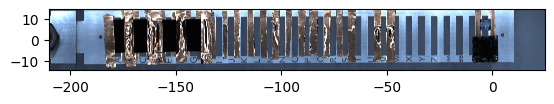

In [12]:
SCAN_ID = 101236
FILE_NAME_BAR_IMAGE_EXPORT = r"20250914_BarImage_Front.jpg"
FILE_PATH_BAR_IMAGE_EXPORT = r"G:/Shared drives/NISTPostdoc/CharacterizationData/BeamTime/20250910_SST1_Commissioning/"


scan_raw = catalog[int(SCAN_ID)]
images = list(scan_raw["primary"]["data"]["Sample Imager Detector Area Camera_image"].read())
image = stitch_sample(images, 25, -6)
im = Image.fromarray(image)
im.save(os.path.join(FILE_PATH_BAR_IMAGE_EXPORT, FILE_NAME_BAR_IMAGE_EXPORT))

- Check if the image looks good and if the optical features on the samples are sufficiently visible to pick spots on the sample. If the image is too bright or dark, the microscope light power can be adjusted from the "RSoXS screen 5" tab in phoebus, and the `image_bar` command can be rerun. Placing a white piece of paper under the bar also can help obtain better images.
- If samples are mounted on the back of the bar, reload the bar into the imager holder with the back side facing up, and rerun the `image_bar` command with front=False and a new file name (e.g., `BarImage_Back`).
- After imaging is complete, remove the bar, and switch off the microscope lamp.

### Locate samples visually from sample bar image

### Map sample positions to instrument reference frame using sample bar fiducials

The position of the sample bar needs to be calibrated with respect to the position of the beam.  This calibration is enabled by a set of small holes (fiducials) on various points on the sample bar.  A series of automated scans are performed using the `find_fiducials()` function in Bluesky in which the sample bar is translated across the fiducial holes in the x (inboard-outboard) and y (up-down) directions.  The positions at which the beam passes through the fiducials and generates signal on a downstream photodiode are the positions for that fiducial.

#### View fiducial scans

View the fiducial scans below to check that each scan shows a peak.

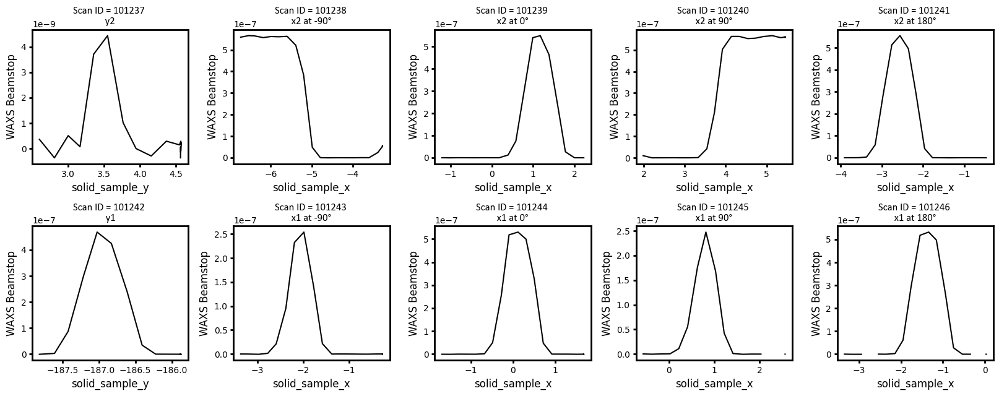

In [14]:
view_fiducial_scans(
    scan_id_start = 101237,
    #maxima = [3.5667649999999753, -5.025, 0.47509999999999764, 3.7, -2.2216650000000016, -186.87915500000003, -2.016085000000004, -0.07313500000000062, 0.809829999999998, -1.7140900000000059],
)

## Beamline calibration

### Energy calibration background

Expand the code below to learn the background of how the energy selection process works and how the energy calibration is performed.  Otherwise, skip to the next section.

The X-ray beam produced by the elliptically polarized undulator (EPU) is a white beam that consists of a broad distribution of energies.  The beamline uses a plane grating monochromator (PGM) to diffract the white beam into its constituent energies.  The angle of the PGM along with the location and size of an exit slit aperture determines which beam energy goes down the beamline. 

Anytime the PGM is translated in the X (inboard-outboard) direction, its rotation angle needs to be calibrated because the X motor does not precisely return to the same location on the PGM, and the beam energy is very sensitive to even slight offsets in the PGM angle.  The PGM angle is calibrated on the basis of the grating equation:

$$m\lambda = d(\sin\alpha + \sin\beta)$$

In this equation, $m$ is an integer that represents the diffraction order, $\lambda$ is the wavelength of the incident light, $d$ is the grating spacing (the distance between adjacent grooves), $\alpha$ is the angle of incidence of the light (from the grating normal), and $\beta$ is the angle of the diffracted light.  If $\alpha$ and $\beta$ are on opposite sides of the grating normal, they will have opposite signs.  To learn how the grating equation is derived, expand the section below.

TODO: The actual grating used by RSoXS is a variable-line-space (VLS) grating, so $d$ is no longer constant.  However, Eliot's codebase still uses the above simplified form of the grating equation.  Get clarification.  Are the other gratings used variable-line spacing?  If so, are these equations correct there and just being translated to RSoXS grating as well?  Eliot might have mentioned that we only use the 250 l/mm portion of the RSoXS grating, but I also have read elsewhere that the VLS is meant to use all spacings together.

#### Deriving the grating equation

The derivation of the grating equation is very similar to the derivation of Bragg's law.  Imagine a ray of light hitting one groove on the grating, and a parallel ray of light hitting the adjacent groove that is length $d$ away.  Both rays have an incident angle of $\alpha$ and diffracted angle of $\beta$.

This drawing shows a sketch of the inboard side of the beamline.  The diffracted beam always points to the right because it represents the portion of the diffracted beam that goes down the beamline and is measured by downstream detectors.  In reality, there will be diffracted (and reflected, 0-order) rays of light going at a variety of angles because the incident beam is a white beam, and the diffracted rays represent a monochromatic beam.  However, only the diffracted rays that go down the beamline can be meaningfully measured and calibrated.

It is also noted that the PGM diffracts light in a grazing incidence geometry rather than in a transmission geometry.  This is because grazing at shallow angles maximizes the beam flux that goes down the beamline, whereas larger angles of incidence would result in a larger fraction of the beam flux being absorbed by the PGM and other optics.

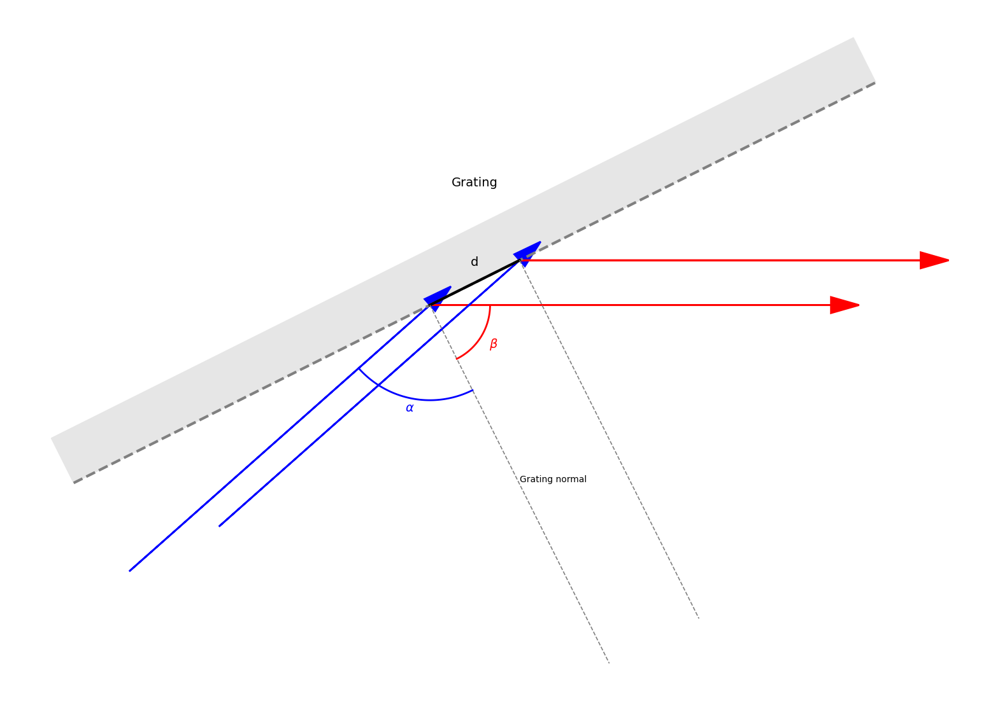

In [16]:
"""
## TODO: write code in own words, and remove the unnecessary parameters

## Define grating geometry
d_grating_spacing = 1.0
slope_grating = 0.5
y_intercept_grating = 2.0
length_grating = 8.0
height_grating = 0.5

## Define line along the bottom of the grating
x_coordinates_along_grating = np.array([-length_grating/2, length_grating/2]) ## Center of grating is 0, endpoints are ends of the bottom of the grating
y_coordinates_along_grating_bottom = slope_grating * x_coordinates_along_grating + y_intercept_grating
"""


## Generated from AI

# ---------- Parameters ----------
d = 1.0
grazing_angle_deg = 15.0
grazing_angle_rad = np.deg2rad(grazing_angle_deg)

m = 0.5
b = 2.0
grating_length = 8.0
grating_height = 0.5
ray_length = 4.0

# ---------- Geometry ----------
x_vals = np.array([-grating_length/2, grating_length/2])
y_vals = m * x_vals + b
p_left, p_right = np.array([x_vals[0], y_vals[0]]), np.array([x_vals[1], y_vals[1]])

t_vec = p_right - p_left
t_hat = t_vec / np.linalg.norm(t_vec)
n_hat = np.array([t_hat[1], -t_hat[0]])
if not (n_hat[0] > 0 and n_hat[1] < 0):
    n_hat = -n_hat
n_hat /= np.linalg.norm(n_hat)

p_left_top, p_right_top = p_left - grating_height * n_hat, p_right - grating_height * n_hat
grating_poly = np.array([p_left, p_right, p_right_top, p_left_top])

midpoint = 0.5 * (p_left + p_right)
p1, p2 = midpoint - 0.5 * d * t_hat, midpoint + 0.5 * d * t_hat

inc_dir = np.cos(grazing_angle_rad) * t_hat - np.sin(grazing_angle_rad) * n_hat
inc_dir /= np.linalg.norm(inc_dir)
if (inc_dir[0] < 0) or (inc_dir[1] < 0):
    inc_dir = -inc_dir
dif_dir = np.array([1.0, 0.0])



# ---------- Arcs ----------
def angle_between(a, b):
    diff = (b - a + np.pi) % (2*np.pi) - np.pi
    return diff

def draw_arc_cw(ax, center, ang_from, ang_to, radius=0.9, npts=120, **kwargs):
    delta = angle_between(ang_from, ang_to)
    if delta >= 0:  # force clockwise
        delta = delta - 2*np.pi
    thetas = np.linspace(ang_from, ang_from + delta, npts)
    xs = center[0] + radius * np.cos(thetas)
    ys = center[1] + radius * np.sin(thetas)
    ax.plot(xs, ys, **kwargs)

def draw_arc_short(ax, center, ang_from, ang_to, radius=0.6, npts=80, **kwargs):
    delta = angle_between(ang_from, ang_to)
    thetas = np.linspace(ang_from, ang_from + delta, npts)
    xs = center[0] + radius * np.cos(thetas)
    ys = center[1] + radius * np.sin(thetas)
    ax.plot(xs, ys, **kwargs)

ang_n   = np.arctan2(n_hat[1], n_hat[0])
ang_inc_in = np.arctan2((-inc_dir)[1], (-inc_dir)[0])  # incoming direction
ang_dif = np.arctan2(dif_dir[1], dif_dir[0])


def right_triangle_third_vertex(p1, p2, ray_dir):
    ray_dir /= np.linalg.norm(ray_dir)
    perp = np.array([-ray_dir[1], ray_dir[0]])
    A = np.column_stack([ray_dir, -perp])
    rhs = (p1 - p2)
    s, t = np.linalg.solve(A, rhs)
    Q = p2 + s * ray_dir
    return Q
q_inc = right_triangle_third_vertex(p1, p2, inc_dir)
# --- FIXED --- Corrected function for path difference triangle vertex
def calculate_path_difference_vertex(p_start, p_end, ray_dir):
    ray_dir_norm = ray_dir / np.linalg.norm(ray_dir)
    p_grating_line_vec = p_end - p_start
    # The path difference leg is perpendicular to the ray direction.
    # We find the projection of the grating segment onto the ray direction to find
    # the vector that forms the adjacent side of the right triangle.
    adj_vec = np.dot(p_grating_line_vec, ray_dir_norm) * ray_dir_norm
    # The third vertex is found by adding the adjacent vector to the start point
    # of the grating segment.
    return p_start + adj_vec
q_dif = calculate_path_difference_vertex(p1, p2, dif_dir)
# --- END FIX ---

# ---------- Zooming (tighter) ----------
inc_starts = [p1 - ray_length * inc_dir, p2 - ray_length * inc_dir]
dif_ends = [p1 + ray_length * dif_dir, p2 + ray_length * dif_dir]
all_x = np.hstack([grating_poly[:,0], np.array(inc_starts)[:,0], np.array(dif_ends)[:,0], [q_inc[0], q_dif[0]]])
all_y = np.hstack([grating_poly[:,1], np.array(inc_starts)[:,1], np.array(dif_ends)[:,1], [q_inc[1], q_dif[1]]])
pad_x = 0.3 * np.max([0.5, (all_x.max() - all_x.min())])
pad_y = 0.3 * np.max([0.5, (all_y.max() - all_y.min())])
xlims, ylims = (all_x.min() - pad_x, all_x.max() + pad_x), (all_y.min() - pad_y, all_y.max() + pad_y)

# ---------- Plot ----------
fig, ax = plt.subplots(figsize=(20,20))  # bigger figure
ax.set_aspect('equal')
ax.axis('off')
#ax.set_xlim(*xlims)
#ax.set_ylim(*ylims)

## Grating
ax.add_patch(patches.Polygon(grating_poly, closed=True, color=(0.9, 0.9, 0.9, 1)))
ax.plot(x_vals, y_vals, '--', color=(0.5, 0.5, 0.5, 1), lw=3)
ax.text(0.5*(p1[0] + p2[0]),  0.75*(p1[1] + p2[1]),  "Grating",  color=(0, 0, 0, 1), fontsize=14, ha='center', va='center')

## Groove distance
ax.plot([p1[0], p2[0]], [p1[1], p2[1]], ls='solid', color=(0, 0, 0, 1), lw=3)
ax.text(0.5*(p1[0] + p2[0]),  0.55*(p1[1] + p2[1]),  "d",  color=(0, 0, 0, 1), fontsize=14, ha='center', va='center')

## Grating normal
norm_len = 4.0
for p in (p1, p2):
    ax.plot([p[0], p[0] + norm_len * n_hat[0]],
            [p[1], p[1] + norm_len * n_hat[1]],
            ls='--', color='gray', lw=1.2)
#ax.arrow(p1[0], p1[1], 0.9*n_hat[0], 0.9*n_hat[1], head_width=0.09, head_length=0.12, fc='k', ec='k', lw=1.2)
ax.text(p1[0] + 2.0*n_hat[0], p1[1] + 2.0*n_hat[1], 'Grating normal', fontsize=10, ha='left', va='bottom')

## Light rays
for p in (p1, p2):
    start = p - ray_length * inc_dir
    ax.arrow(start[0], start[1], p[0]-start[0], p[1]-start[1], head_width=0.16, head_length=0.28, fc='b', ec=(0, 0, 1, 1), lw=2)
    ax.arrow(p[0], p[1], ray_length * dif_dir[0], ray_length * dif_dir[1], head_width=0.16, head_length=0.28, fc='r', ec='r', lw=2)

## Label angles
draw_arc_cw(ax, p1, ang_n, ang_inc_in, radius=0.95, color='b', lw=2)  ## α arc
mid_alpha = (ang_n + angle_between(ang_n, ang_inc_in)/2.0)
ax.text(p1[0] + 1.05*np.cos(mid_alpha), p1[1] + 1.05*np.sin(mid_alpha), r"$\alpha$", color='b', fontsize=14, ha='center', va='center')
draw_arc_short(ax, p1, ang_n, ang_dif, radius=0.6, color='r', lw=2) ## β arc 
mid_beta  = ang_n + angle_between(ang_n, ang_dif)/2.0
ax.text(p1[0] + 0.75*np.cos(mid_beta),  p1[1] + 0.75*np.sin(mid_beta),  r"$\beta$",  color='r', fontsize=14, ha='center', va='center')





plt.show()


The second incident ray (bottom blue ray) has to travel an extra distance to reach the grating.  This extra distance is depicted as the leg of a right triangle with a hypotenuse of length $d$.  Using trigonometry, this extra distance is $d sin(\alpha)$.

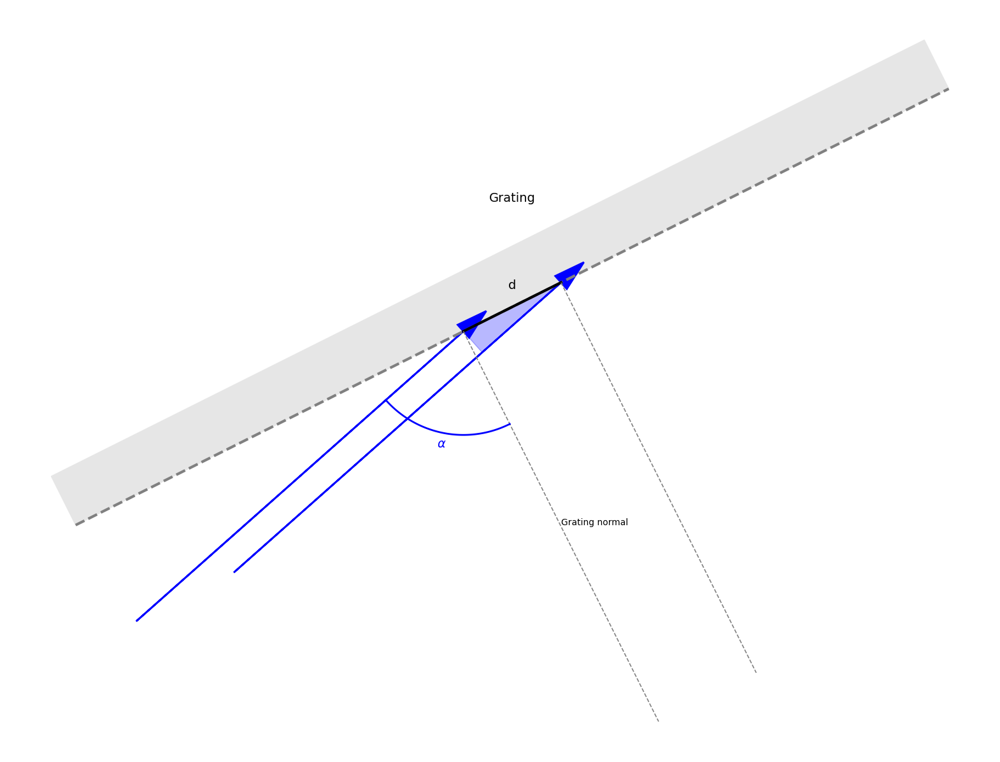

In [17]:
# ---------- Plot ----------
fig, ax = plt.subplots(figsize=(20,20))  # bigger figure
ax.set_aspect('equal')
ax.axis('off')
#ax.set_xlim(*xlims)
#ax.set_ylim(*ylims)

## Grating
ax.add_patch(patches.Polygon(grating_poly, closed=True, color=(0.9, 0.9, 0.9, 1)))
ax.plot(x_vals, y_vals, '--', color=(0.5, 0.5, 0.5, 1), lw=3)
ax.text(0.5*(p1[0] + p2[0]),  0.75*(p1[1] + p2[1]),  "Grating",  color=(0, 0, 0, 1), fontsize=14, ha='center', va='center')

## Groove distance
ax.plot([p1[0], p2[0]], [p1[1], p2[1]], ls='solid', color=(0, 0, 0, 1), lw=3)
ax.text(0.5*(p1[0] + p2[0]),  0.55*(p1[1] + p2[1]),  "d",  color=(0, 0, 0, 1), fontsize=14, ha='center', va='center')

## Grating normal
norm_len = 4.0
for p in (p1, p2):
    ax.plot([p[0], p[0] + norm_len * n_hat[0]],
            [p[1], p[1] + norm_len * n_hat[1]],
            ls='--', color='gray', lw=1.2)
#ax.arrow(p1[0], p1[1], 0.9*n_hat[0], 0.9*n_hat[1], head_width=0.09, head_length=0.12, fc='k', ec='k', lw=1.2)
ax.text(p1[0] + 2.0*n_hat[0], p1[1] + 2.0*n_hat[1], 'Grating normal', fontsize=10, ha='left', va='bottom')

## Light rays
for p in (p1, p2):
    start = p - ray_length * inc_dir
    ax.arrow(start[0], start[1], p[0]-start[0], p[1]-start[1], head_width=0.16, head_length=0.28, fc='b', ec=(0, 0, 1, 1), lw=2)
    #ax.arrow(p[0], p[1], ray_length * dif_dir[0], ray_length * dif_dir[1], head_width=0.16, head_length=0.28, fc='r', ec='r', lw=2)

## Label angles
draw_arc_cw(ax, p1, ang_n, ang_inc_in, radius=0.95, color='b', lw=2)  ## α arc
mid_alpha = (ang_n + angle_between(ang_n, ang_inc_in)/2.0)
ax.text(p1[0] + 1.05*np.cos(mid_alpha), p1[1] + 1.05*np.sin(mid_alpha), r"$\alpha$", color='b', fontsize=14, ha='center', va='center')
#draw_arc_short(ax, p1, ang_n, ang_dif, radius=0.6, color='r', lw=2) ## β arc 
#mid_beta  = ang_n + angle_between(ang_n, ang_dif)/2.0
#ax.text(p1[0] + 0.75*np.cos(mid_beta),  p1[1] + 0.75*np.sin(mid_beta),  r"$\beta$",  color='r', fontsize=14, ha='center', va='center')


## Draw triangles
ax.add_patch(patches.Polygon([p1, p2, q_inc], closed=True, color='b', alpha=0.28))


plt.show()


Similarly, the second diffracted ray (bottom red ray) has to travel an extra distance of $d sin(\beta)$.

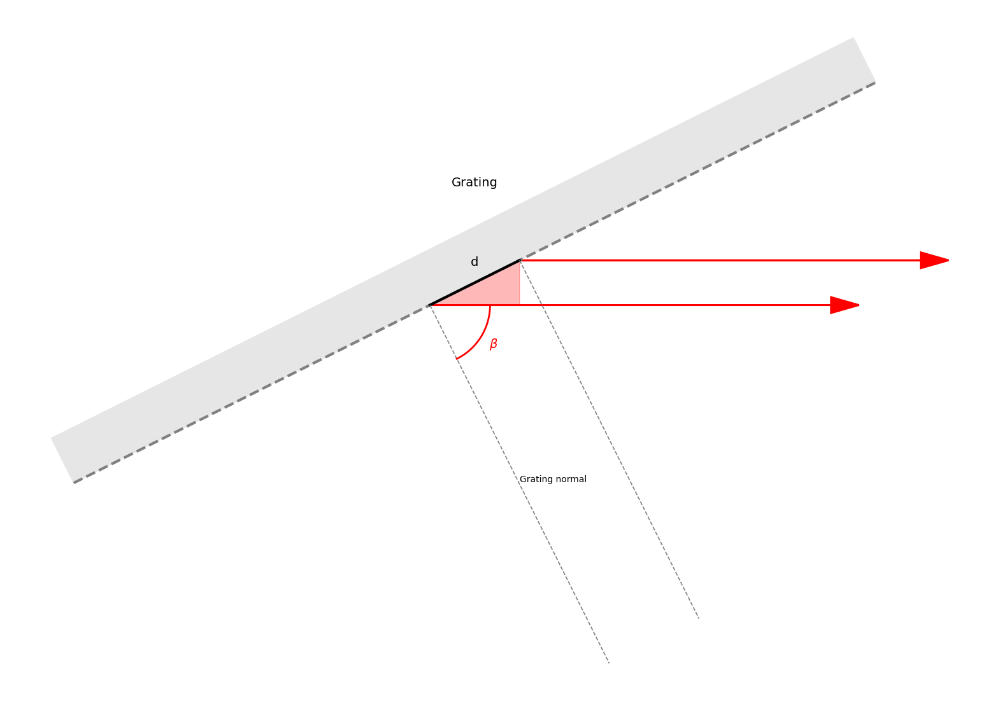

In [18]:
# ---------- Plot ----------
fig, ax = plt.subplots(figsize=(20,20))  # bigger figure
ax.set_aspect('equal')
ax.axis('off')
#ax.set_xlim(*xlims)
#ax.set_ylim(*ylims)

## Grating
ax.add_patch(patches.Polygon(grating_poly, closed=True, color=(0.9, 0.9, 0.9, 1)))
ax.plot(x_vals, y_vals, '--', color=(0.5, 0.5, 0.5, 1), lw=3)
ax.text(0.5*(p1[0] + p2[0]),  0.75*(p1[1] + p2[1]),  "Grating",  color=(0, 0, 0, 1), fontsize=14, ha='center', va='center')

## Groove distance
ax.plot([p1[0], p2[0]], [p1[1], p2[1]], ls='solid', color=(0, 0, 0, 1), lw=3)
ax.text(0.5*(p1[0] + p2[0]),  0.55*(p1[1] + p2[1]),  "d",  color=(0, 0, 0, 1), fontsize=14, ha='center', va='center')

## Grating normal
norm_len = 4.0
for p in (p1, p2):
    ax.plot([p[0], p[0] + norm_len * n_hat[0]],
            [p[1], p[1] + norm_len * n_hat[1]],
            ls='--', color='gray', lw=1.2)
#ax.arrow(p1[0], p1[1], 0.9*n_hat[0], 0.9*n_hat[1], head_width=0.09, head_length=0.12, fc='k', ec='k', lw=1.2)
ax.text(p1[0] + 2.0*n_hat[0], p1[1] + 2.0*n_hat[1], 'Grating normal', fontsize=10, ha='left', va='bottom')

## Light rays
for p in (p1, p2):
    start = p - ray_length * inc_dir
    #ax.arrow(start[0], start[1], p[0]-start[0], p[1]-start[1], head_width=0.16, head_length=0.28, fc='b', ec=(0, 0, 1, 1), lw=2)
    ax.arrow(p[0], p[1], ray_length * dif_dir[0], ray_length * dif_dir[1], head_width=0.16, head_length=0.28, fc='r', ec='r', lw=2)

## Label angles
#draw_arc_cw(ax, p1, ang_n, ang_inc_in, radius=0.95, color='b', lw=2)  ## α arc
#mid_alpha = (ang_n + angle_between(ang_n, ang_inc_in)/2.0)
#ax.text(p1[0] + 1.05*np.cos(mid_alpha), p1[1] + 1.05*np.sin(mid_alpha), r"$\alpha$", color='b', fontsize=14, ha='center', va='center')
draw_arc_short(ax, p1, ang_n, ang_dif, radius=0.6, color='r', lw=2) ## β arc 
mid_beta  = ang_n + angle_between(ang_n, ang_dif)/2.0
ax.text(p1[0] + 0.75*np.cos(mid_beta),  p1[1] + 0.75*np.sin(mid_beta),  r"$\beta$",  color='r', fontsize=14, ha='center', va='center')


## Draw triangles
#ax.add_patch(patches.Polygon([p1, p2, q_inc], closed=True, color='b', alpha=0.28))
ax.add_patch(patches.Polygon([p1, p2, q_dif], closed=True, color='r', alpha=0.28))

plt.show()

The total extra distance is $d sin(\alpha) + d sin(\beta) = d (sin(\alpha) + sin(\beta))$.  In order for the diffracted waves to interfere constructively, the total extra distance has to be equal to an integer multiple of the the beam wavelength.  Thus,

$$m\lambda = d(\sin\alpha + \sin\beta)$$

#### Using the grating equation for energy calibration

The grating equation can be used to calculate the theoretical diffracted beam energy by incorporating $E = hc/\lambda$ and $k = 1/d$, in which $k$ is the lines per millimeter in the grating: https://github.com/xraygui/nbs-bl/blob/master/nbs_bl/gGrEqns.py#L55

$$ E = \frac{m k h c}{\sin\alpha + \sin\beta} $$ 

The $\alpha$ and $\beta$ angles are calculated from the PGM and M2 (mirror 2) angles assuming that 0° is defined as the PGM and M2 surfaces being parallel to the beamline floor with the PGM surface facing downwards and the M2 reflective surface facing upwards; if the PGM and M2 are rotated to the same angle, their surfaces are parallel to each other (TODO: check motor position definitions).  M2 is lower and more upstream than the PGM.

<br>

The real beam energy and associated PGM angle are found by scanning the PGM angle, measuring the associated sample currents from an HOPG reference sample near its 291.65 eV peak, and finding the PGM angle that results in the maximum sample current.  Note that because the PGM is being rotated, the beam energy varies with the PGM angle, and the scanned profile should resemble a segment of an HOPG energy scan.  

TODO: Find out how the diffraction order is verified.  At the moment, the order of magnitude of the sample current is used to qualitatively assess that the first order of diffraction is used, as zero order would produce a significantly brighter signal, and second (or higher) order would produce a signal that is significantly weaker.

By applying offsets to the PGM and M2 angles (floating parameters), the difference between the theoretical energy calculated from the grating equation and the real beam energy at which the maxima were found can be minimized:  https://github.com/xraygui/nbs-bl/blob/master/nbs_bl/gGrEqns.py#L100  
For a single scan at a particular condition, there can be an infinite number of solutions for the PGM and M2 angle offsets.  However, if scans are performed at a variety of conditions, a larger portion of the energy phase space is sampled, and only a single set of offsets can satisfy all conditions.  Typically, scans are performed at a variety of constants of fixed foci (CFFs).  Alternatively, different standards can be used at different energies, and all of those scans can similarly be used to solve this multidimensional problem.


#### Constant of fixed focus

The PGM is a focusing grating.  RSoXS normally operates at CFF = 1.45, which places the vertical focal point of the beam at the location of RSoXS slits 1.  This will maximize energy resolution because the "sub-beams" associated with each energy will be at their narrowest and blend the least with other energies.  When scanning HOPG or another material with sharp peaks, the consequence will be that the most intense peak will show maximum intensity relative to other CFFs because it is less convoluted with neighboring lower-intensity peaks.

TODO: Add more details on how CFF works.

### Energy calibration viewing

If a different end station was used prior to this beam time or the grating was changed, the energy should be calibrated.  Use the code below to view the calibration scans.  Specifically, ensure that the following features are present.
- The shape of the scan should resemble the shape of HOPG at 291.65 eV (an intense peak followed by a less-intense peak/shoulder), as the rotation of the PGM effectively sends different energies down the beamline.  If this shape not seen, it might be possible that the optics are significantly misaligned such that an entirely different peak/region of HOPG may be scanned.  However, also be aware that certain CFFs may have poor energy resolution such that the two peaks may be convoluted into a single broad peak.
- Ideally, CFF = 1.45 should produce the most intense peaks with sharpest energy resolution, as the focal point should be placed at RSoXS slits 1.  The surrounding CFFs should produce peaks with increasingly lower intensity and poorer resolution.  However, if this is the first energy calibration after the PGM is translated, the offsets might be misaligned that a different CFF might produce better intensity and resolution; this should get corrected after the offsets are corrected.

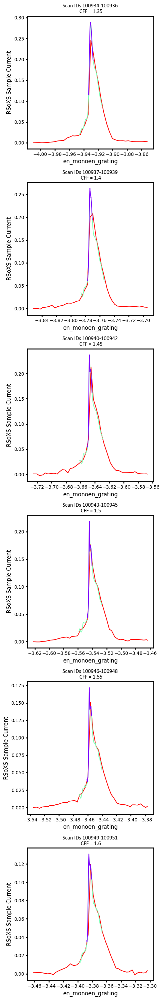

In [19]:
view_pgm_tuning_scans(
    scan_id_start = 100934,
    cffs = [1.35,1.4,1.45,1.5,1.55,1.6]
    #maxima = np.full(5, np.nan),
)

### Validate energy calibration: HOPG energy scan

Run a standard carbon-edge energy scan on HOPG at 90° polarization at which the beam energy was calibrated.  Tilt the sample bar such that the incident beam is 20° from the HOPG surface such that there is a large incident beam footprint on the HOPG.  It is recommended to run sweeps in ascending and descending energy order.

Check to ensure the following items:
- The most intense peak occurs at 291.65 eV.
- Energy resolution looks reasonable.
- Sweeps in ascending and descending energy order are identical.

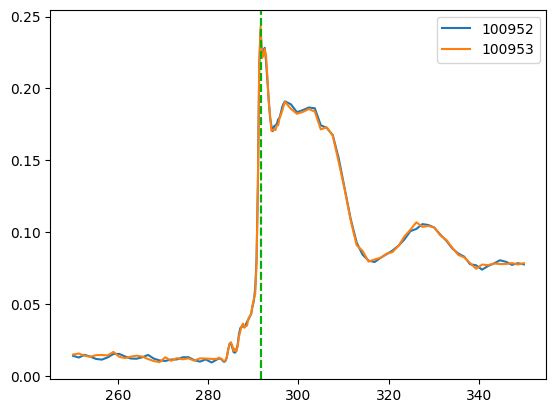

In [23]:
## TODO: write a better-formatted function
#ScanIDs = [100739, 100740, 100743, 100744]
ScanIDs = [100952, 100953]

for ScanID in ScanIDs:
    Scan_Raw = catalog[int(ScanID)]
    plt.plot(Scan_Raw["primary"]["data"]["en_energy"].read(), Scan_Raw["primary"]["data"]["RSoXS Sample Current"].read(),label=ScanID)
    plt.axvline(291.65, color=(0, 0.7, 0, 1), linestyle="dashed")
plt.legend()

### Check slit scattering

### Create a mask to hide unwanted artifacts on 2D detector images

If you want to make a custom mask for this sample, do the following. Use the mask drawing tool to conceal parts of the image that are not related to the sample such as the beamstop, slit scattering, etc. If unable to draw a mask directly onto the image via clicking, hover over the desired vertices and copy the coordinates to an existing mask file. Note that the pix_y and pix_x seen while hovering over the image; values for pix_y should be entered into the x section of the mask file and vice versa.

TODO: Dean has an automated algorithm for mask drawing. Merge here.

In [9]:
scan = loader.loadRun(run=96389).unstack('system') ## Load entire scan
scan_single_image = scan.sel(energy=300, method="nearest")


from PyHyperScattering.IntegrationUtils import DrawMask
mask = DrawMask(scan_single_image)
mask.ui()

C:\Users\pmk\AppData\Local\miniforge3\envs\20250616_1\Lib\site-packages\PyHyperScattering\SST1RSoXSDB.py:596: UserWarning: 
Wide Angle CCD Detector is reported as underexposed
at one or more energies per definitions here:
https://github.com/NSLS-II-SST/rsoxs/blob/10c2c41b695c1db552f62decdde571472b71d981/rsoxs/Base/detectors.py#L110-L119
Wide Angle CCD Detector is reported as underexposed at all energies.
  md = self.loadMd(run)
C:\Users\pmk\AppData\Local\Temp\ipykernel_2904\1122909844.py:1: UserWarning: Monitor streams loaded successfully, but could not be correlated to images.  Check monitor stream for issues, probable metadata change.
  scan = loader.loadRun(run=96389).unstack('system') ## Load entire scan


Usage: click the "PolyAnnotator" tool at top right.  DOUBLE CLICK to start drawing a masked object, SINGLE CLICK to add a vertex, then DOUBLE CLICK to finish.  Click/drag individual vertex to adjust.


:Layout
   .DynamicMap.I :DynamicMap   []
      :Overlay
         .Image.I    :Image   [pix_y,pix_x]   (Wide Angle CCD Detector_image)
         .Polygons.I :Polygons   [x,y]   (Label,Value)
   .Annotator.I  :Overlay
      .Table.PolyAnnotator          :Table   [Label]
      .Table.PolyAnnotator_Vertices :Table   [x,y]   (Value)

### Find beam center

Load a scan for a sample that has strong Bragg peaks.
SBA-15 is one option (https://www.sigmaaldrich.com/US/en/product/aldrich/806854).  It is known to have a characteristic pore size of 8 nm.
Choose a single scattering image to use for beam center calculations.
Ideally, choose the scattering image at 291.65 eV and 90° polarization, the conditions at which the beam energy was calibrated and is most accurate.

<br>

First, use the viewer function to manually adjust the beam center initial guess coordinates as well as the Bragg ring radius and find a guess that is reasonably close.  The viewer will show the original scattering image as intensity vs. pix_y, pix_x.  This image can be annotated with a crosshair and circle to line up with the Bragg ring.  The viewer will also show an intensity vs. chi, radius image based on the guessed beam center.  The correct beam center should show the Bragg peaks as straight lines across chi.  If the Bragg peaks are wavey, this is another indication to adjust the beam center guess.  Finally, the viewer will show intensity vs. radius plots for different chi slices.  The Bragg peak maximum should line up at the same radius for all plots if the correct beam center is chosen.

In [8]:
SCAN = loader.loadRun(run=96389).unstack('system') ## Load entire scan
IMAGE_SINGLE = SCAN.sel(energy=300, method="nearest") ## Choosing a single image/energy to perform beam centering
BEAMCENTER_INITIAL_GUESS = [475, 500] ## [pixels]
RADIUS_BRAGG_RING_INITIAL_GUESS = 310 ## [pixels]
mask.load(r"BeamstopMask_Format_ScanID96389_20250807.msk") ## Update mask file path
FIGURE_TITLE = "300 eV"


## Apply mask to the selected image
image_single_masked = IMAGE_SINGLE.where(~mask.mask)

view_beam_center_guess(
    image_single = image_single_masked,
    beamcenter_guess = BEAMCENTER_INITIAL_GUESS,
    radius_bragg_ring_guess = RADIUS_BRAGG_RING_INITIAL_GUESS,
    figure_title = FIGURE_TITLE,
)

C:\Users\pmk\AppData\Local\miniforge3\envs\20250616_1\Lib\site-packages\PyHyperScattering\SST1RSoXSDB.py:596: UserWarning: 
Wide Angle CCD Detector is reported as underexposed
at one or more energies per definitions here:
https://github.com/NSLS-II-SST/rsoxs/blob/10c2c41b695c1db552f62decdde571472b71d981/rsoxs/Base/detectors.py#L110-L119
Wide Angle CCD Detector is reported as underexposed at all energies.
  md = self.loadMd(run)
C:\Users\pmk\AppData\Local\Temp\ipykernel_2904\1099967830.py:1: UserWarning: Monitor streams loaded successfully, but could not be correlated to images.  Check monitor stream for issues, probable metadata change.
  SCAN = loader.loadRun(run=96389).unstack('system') ## Load entire scan


NameError: name 'mask' is not defined

After finding a reasonable initial guess above, run the automated algorithm below to calculate the beam center and radius of the Bragg ring.

The beam center is (pixels, pixels): [474, 501]
The radius of the Bragg ring is (pixels): 307.25


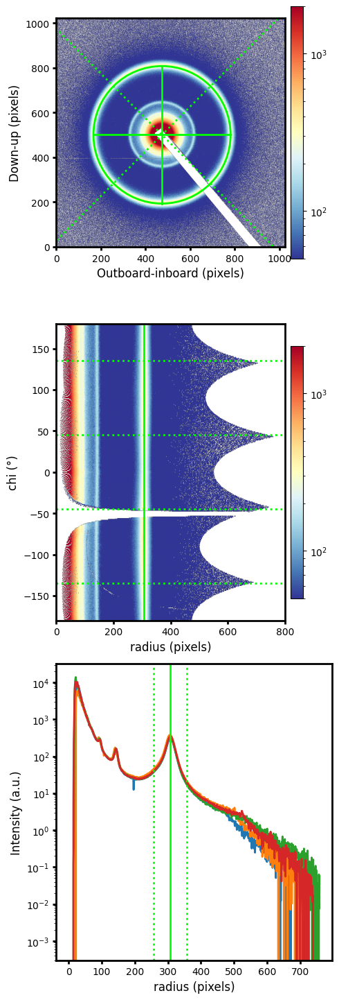

([474, 501], 307.25)

In [15]:
find_beam_center(
    image_single = image_single_masked,
    beamcenter_initial_guess = BEAMCENTER_INITIAL_GUESS,
    radius_bragg_ring_initial_guess = RADIUS_BRAGG_RING_INITIAL_GUESS,
)

### Find sample-to-detector distance (SDD)

The beam hits the sample at normal incidence (perpendicular to the substrate surface) and scatters at an angle of 2θ from the transmitted direct beam.
With the length scale of the sample structure and beam energy known, the sample-to-detector distance can be solved by using the equation for the scattering vector:

$$q = \frac{4\pi}{\lambda} \sin\theta$$


In [13]:
SAMPLE_STRUCTURE_LENGTH_SCALE = 8 ## [nm]
RADIUS_BRAGG_RING = 307.25 ## [pixels]
ENERGY_BEAM = 300 ## [eV]


calculate_sample_to_detector_distance(
    sample_structure_length_scale = SAMPLE_STRUCTURE_LENGTH_SCALE,
    radius_bragg_ring = RADIUS_BRAGG_RING,
    length_pixel = 60,
    energy_beam = ENERGY_BEAM,
)

The sample-to-detector distance is (mm): 32.00968451394524


32.00968451394524

### Validate energy calibration: Bragg scattering

Another way to assess the true beam energy is to use scattering data from a sample with known feature length scales and sample-to-detector distance.  In this example, SBA-15 is used, as it was already used above to find the beam center and sample-to-detector distance at 291.65 eV.

Now, SBA-15 can be measured at different energies.  The length-scale corresponding to the primary bragg peak as well as the sample-to-detector distance are known, and they can be used to calculate the beam wavelength and energy.  The code below also gathers the beam centers across the different energies to assess whether the beam moves significantly.

$$q = \frac{4\pi}{\lambda} \sin\theta$$

It is recommended to perform the energy scan between 200 and 1300 eV.  Below 200 eV, the Bragg ring angle becomes too large such that it is no longer visible on the 2D detector or hidden in the high-q noise.  Above 1300 eV, the RSoXS 250 l/mm grating no longer is reliable.  It is also recommended to perform the energy scans at different polarizations to assess any polarization-dependent effects.

In [ ]:
SCAN = loader.loadRun(run=93237).unstack('system') ## Load entire scan
BEAMCENTER_INITIAL_GUESS = [458, 504] ## [pixels]
SAMPLE_STRUCTURE_LENGTH_SCALE = 8 ## [nm]
DISTANCE_SAMPLE_TO_DETECTOR = 31.005248154973497 ## [mm]

ENERGIES_SETPOINT = np.array(SCAN["energy"])
ENERGIES_SETPOINT = ENERGIES_SETPOINT[ENERGIES_SETPOINT >= 200] ## Below this, the Bragg ring is at too high q



BEAM_CENTERS = []
ENERGIES_ACTUAL = []

for energy in ENERGIES_SETPOINT:
    print("Energy = " + str(energy) + " eV")
    IMAGE_SINGLE = SCAN.sel(energy=energy, method="nearest") ## Choosing a single image/energy to perform beam centering
    mask.load(r"BeamstopMask_Format_ScanID93236_20250922.msk") ## Update mask file path
    image_single_masked = IMAGE_SINGLE.where(~mask.mask)

    ## Estimate bragg ring radius to use as initial guess
    radius_bragg_ring_initial_guess = calculate_bragg_ring_radius(
        sample_structure_length_scale = SAMPLE_STRUCTURE_LENGTH_SCALE,
        distance_sample_to_detector = DISTANCE_SAMPLE_TO_DETECTOR,
        length_pixel = 60,
        energy_beam = energy,
    )

    beam_center, radius_bragg_ring = find_beam_center(
        image_single = image_single_masked,
        beamcenter_initial_guess = BEAMCENTER_INITIAL_GUESS,
        radius_bragg_ring_initial_guess = radius_bragg_ring_initial_guess,
        show_figure = False,
    )

    energy_beam = calculate_beam_energy(
        sample_structure_length_scale = SAMPLE_STRUCTURE_LENGTH_SCALE,
        radius_bragg_ring = radius_bragg_ring,
        distance_sample_to_detector = DISTANCE_SAMPLE_TO_DETECTOR,
        length_pixel = 60,
    )

    BEAM_CENTERS.append(beam_center)
    ENERGIES_ACTUAL.append(energy_beam)

    ## Deciding to print this with every iteration so that if it stops in between, we have a list, and then we can just run the remaining ones
    print("Setpoint energies: " + str(ENERGIES_SETPOINT.tolist()))
    print("Beam centers: " + str(BEAM_CENTERS))
    print("Actual energies: " + str(ENERGIES_ACTUAL))

#### Manual beam centering (if necessary)

If troubleshooting is necessary, the loop can be run over a single energy with `show_figure = True` to view the fit.  Alternatively, the `view_beam_center_guess()` function can be used in the "Find beam center" section above to manually locate a beam center.

Below is an example script for manual beam centering

In [ ]:
SCAN = loader.loadRun(run=93237).unstack('system') ## Load entire scan

In [ ]:
IMAGE_SINGLE = SCAN.sel(energy=1300, method="nearest") ## Choosing a single image/energy to perform beam centering
BEAMCENTER_INITIAL_GUESS = [458, 504] ## [pixels]
RADIUS_BRAGG_RING_INITIAL_GUESS = 350 ## [pixels] ## 317.75, 306.75, 220.25, 172.75, 142.75
mask.load(r"BeamstopMask_Format_ScanID93236_20250922.msk") ## Update mask file path
#FIGURE_TITLE = "300 eV"


## Apply mask to the selected image
image_single_masked = IMAGE_SINGLE.where(~mask.mask)

view_beam_center_guess(
    image_single = image_single_masked,
    beamcenter_guess = BEAMCENTER_INITIAL_GUESS,
    radius_bragg_ring_guess = RADIUS_BRAGG_RING_INITIAL_GUESS,
    #figure_title = FIGURE_TITLE,
)

In [ ]:
find_beam_center(
    image_single = image_single_masked,
    beamcenter_initial_guess = BEAMCENTER_INITIAL_GUESS,
    radius_bragg_ring_initial_guess = RADIUS_BRAGG_RING_INITIAL_GUESS,
)

In [ ]:
RADIUS_BRAGG_RING = 142.5 ## [pixels] ## 317.75, 306.75, 220.25, 172.75, 142.75
SAMPLE_STRUCTURE_LENGTH_SCALE = 8 ## [nm]
DISTANCE_SAMPLE_TO_DETECTOR = 31.960803248151926 ## [mm]


calculate_beam_energy(
    sample_structure_length_scale = SAMPLE_STRUCTURE_LENGTH_SCALE,
    radius_bragg_ring = RADIUS_BRAGG_RING,
    distance_sample_to_detector = DISTANCE_SAMPLE_TO_DETECTOR,
    length_pixel = 60,
)

#### Plot energy deviations

The results from the above analyses can be summarized into an xarray dataset and then plotted, as shown below.

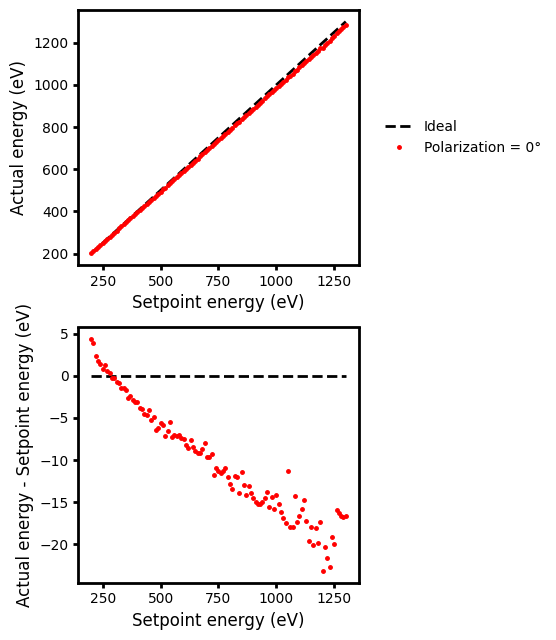

In [11]:
## Scan ID 93237
ENERGIES_SETPOINT = np.arange(200, 1310, 10)
POLARIZATIONS = [0]

BEAM_CENTERS = [
    [[460, 508], [460, 505], [458, 504], [459, 503], [458, 505], [458, 504], [458, 505], [459, 504], [459, 505], [459, 504], [458, 505], [460, 505], [459, 505], [459, 505], [459, 505], [459, 504], [459, 505], [459, 505], [459, 504], [459, 504], [460, 504], [460, 505], [460, 504], [460, 504], [460, 504], [460, 504], [460, 504], [460, 505], [460, 504], [460, 504], [460, 504], [459, 505], [459, 505], [460, 504], [459, 505], [460, 504], [460, 504], [460, 505], [459, 505], [460, 504], [459, 505], [460, 505], [460, 504], [459, 505], [459, 505], [459, 505], [459, 505], [459, 505], [459, 505], [459, 505], [460, 504], [460, 505], [459, 505], [460, 505], [459, 505], [460, 506], [459, 505], [460, 504], [459, 505], [460, 505], [460, 504], [460, 505], [460, 505], [460, 504], [460, 506], [459, 505], [459, 505], [460, 505], [460, 505], [460, 505], [460, 505], [460, 505], [460, 505], [460, 505], [460, 505], [460, 505], [460, 505], [459, 505], [459, 505], [460, 505], [460, 505], [460, 505], [460, 505], [459, 505], [460, 505], [460, 505], [460, 505], [461, 505], [461, 505], [460, 504], [460, 505], [459, 505], [460, 505], [460, 505], [460, 505], [460, 505], [459, 505], [460, 505], [460, 505], [459, 505], [460, 505], [459, 505], [460, 505], [460, 505], [460, 505], [460, 505], [461, 505], [460, 505], [460, 505], [460, 504], [461, 505]],
]
## SDD was calculated at 291.65 eV, 0 degrees polarization
ENERGIES_ACTUAL = [
    [204.3576483234755, 213.95235786875085, 222.4069140726808, 231.74302083717205, 241.40570447558332, 250.85811133508065, 261.26047955559596, 270.5671305840901, 280.3856196111212, 289.7785660791947, 299.6814985832485, 309.21712464951474, 319.1175954376933, 328.5856519045495, 338.5282008610891, 348.3641503087222, 357.3386645166058, 367.5883482800337, 377.12155309168935, 386.88630370568313, 396.86611885948207, 406.1695873112182, 416.00275961620343, 425.4390347092665, 435.3868895100619, 445.88733699301855, 454.7159630399605, 465.1375540529083, 473.6259871413854, 483.7658397750719, 494.4058525996636, 504.1548991099656, 512.8586107208828, 523.4439182527482, 534.5234381099896, 542.7588930159626, 553.0164844554137, 562.7989849044178, 572.9662097412906, 582.5619418525749, 592.5124793850559, 601.7874643311335, 611.3809447336811, 622.4337908884868, 631.5897773104617, 641.0388254515012, 650.7949374984884, 660.8730206197052, 671.2889612921842, 682.0597070773264, 690.3814487765595, 700.3660453033763, 710.6607215692189, 718.2118588235153, 729.0721475890708, 738.6599928486396, 748.5166595696033, 758.6534353731041, 769.0822482220199, 778.0050883272028, 787.1471672230891, 796.5165500630726, 808.0717995526409, 817.9716499115748, 826.0753296513703, 838.5490609851072, 847.0847812365622, 855.8029222909677, 866.9660485426759, 876.1163739007983, 885.4690418762626, 895.0307625217288, 904.8085457568183, 914.8097183096124, 925.0419418198526, 935.5132321978579, 946.2319803419601, 954.4387065916615, 965.6119044228074, 974.1701923654787, 985.827074570084, 994.759784393861, 1003.8604528267612, 1013.1338196115543, 1022.5848044722388, 1038.7451164406798, 1042.0402594758384, 1052.0555491386485, 1065.720278397141, 1072.6899190503455, 1083.3211583833875, 1094.1702855132119, 1105.244017270819, 1112.7547282224675, 1120.370511275201, 1131.996035611225, 1139.8842806537252, 1151.929402077565, 1160.1048908225976, 1172.5925815287894, 1176.8163113206256, 1189.6757397626566, 1198.4090572271925, 1207.2740306782248, 1220.8248919530265, 1230.0322475249227, 1244.1114900017408, 1253.681328421957, 1263.4021423313807, 1273.2775125089925, 1283.3111338597755],
]
   
SBA15_SUMMARY = xr.Dataset(
    data_vars = {
        "beam_center": (("polarization_setpoint", "energy_setpoint", "beam_coordinates"), BEAM_CENTERS),
        "energy_actual": (("polarization_setpoint", "energy_setpoint"), ENERGIES_ACTUAL),
    },
    coords = {
        "polarization_setpoint": POLARIZATIONS,
        "energy_setpoint": ENERGIES_SETPOINT,
        "beam_coordinates": ["x", "y"],
    },
)


number_rows, number_columns = 2, 1
fig, axs = plt.subplots(number_rows, number_columns, figsize=(number_columns*5.75, number_rows*3.25), edgecolor=(0, 0, 0, 0), linewidth=3) #figsize=(3.25, 3.25) for figure
## Ensure axs always stays a 2D array
if number_rows == 1 and number_columns == 1: axs = np.array([[axs]])
if number_rows == 1 and number_columns > 1: axs = axs.reshape(1, number_columns)
if number_rows > 1 and number_columns == 1: axs = axs.reshape(number_rows, 1)
plot_colors = cm.rainbow(np.linspace(1, 0, len(np.array(SBA15_SUMMARY["polarization_setpoint"]))))


## Plot data
ax = axs[0, 0]
ax.plot(SBA15_SUMMARY["energy_setpoint"], SBA15_SUMMARY["energy_setpoint"], label="Ideal", marker=".", markersize=0, color=(0, 0, 0, 1), linestyle="dashed", linewidth=2)
for index_polarization, polarization in enumerate(np.array(SBA15_SUMMARY["polarization_setpoint"])):
    plot_color = plot_colors[index_polarization]
    ax.plot(SBA15_SUMMARY["energy_setpoint"], SBA15_SUMMARY["energy_actual"].sel(polarization_setpoint=polarization), label=("Polarization = " + str(polarization) + "°"), marker=".", markersize=5, color=plot_color, linestyle="none", linewidth=2)
ax.set_ylabel("Actual energy (eV)", color=(0, 0, 0, 1), size=12)

ax = axs[1, 0]
ax.plot(SBA15_SUMMARY["energy_setpoint"], np.zeros(len(ENERGIES_SETPOINT)), label="Ideal", marker=".", markersize=0, color=(0, 0, 0, 1), linestyle="dashed", linewidth=2)
for index_polarization, polarization in enumerate(np.array(SBA15_SUMMARY["polarization_setpoint"])):
    plot_color = plot_colors[index_polarization]
    ax.plot(SBA15_SUMMARY["energy_setpoint"], (SBA15_SUMMARY["energy_actual"].sel(polarization_setpoint=polarization) - SBA15_SUMMARY["energy_setpoint"]), label=("Polarization = " + str(polarization) + "°"), marker=".", markersize=5, color=plot_color, linestyle="none", linewidth=2)
ax.set_ylabel("Actual energy - Setpoint energy (eV)", color=(0, 0, 0, 1), size=12)


## Plot Formatting
for index_row in np.arange(0, number_rows, 1):
    for index_column in np.arange(0, number_columns, 1):
        ax = axs[index_row, index_column]
        ## Subplot and axes labels
        ax.set_xlabel("Setpoint energy (eV)", color=(0, 0, 0, 1), size=12)
        #ax.set_ylabel("I0", color=(0, 0, 0, 1), size=12)
        ## Axes scaling and ranges
        ax.set_xscale("linear")
        ax.set_yscale("linear")
        #ax.set_xlim([0, 0.08])
        #ax.set_ylim(bottom=0, top=None, auto=True)
        ## Border formatting
        for Border in np.array(["top", "bottom", "left", "right"]):
            ax.spines[Border].set_linewidth(2) ## axes/border linewidths
            ax.spines[Border].set_color((0, 0, 0, 1)) ## axes/border colors
        for Axis in np.array(["x", "y"]): ax.tick_params(axis=Axis, colors=(0, 0, 0, 1), width=2)
axs[0, 0].legend(ncol=1, loc="center left", bbox_to_anchor=(1.05, 0.5), edgecolor=(1, 1, 1, 1))
plt.tight_layout() ## This ensures that subplots don't overlap

plt.show()

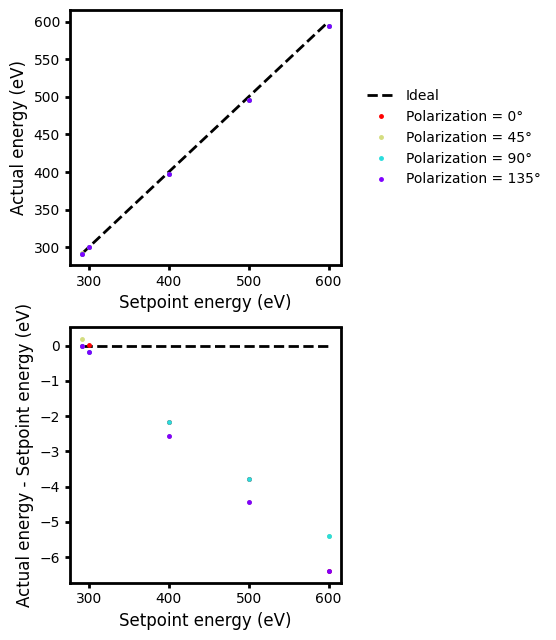

In [12]:
## Scan IDs 100878-100881
ENERGIES_SETPOINT = [291.65, 300.0, 400.0, 500.0, 600.0]
POLARIZATIONS = [0, 45, 90, 135]

## Outer list is polarizaitons
## Next-outer list is energies
## Inner-most list is beam centers
BEAM_CENTERS = [
    [[474, 502], [474, 502], [475, 503], [475, 503], [476, 503]], ## 0° polarization
    [[474, 503], [474, 502], [474, 502], [475, 503], [475, 503]], ## 45° polarization
    [[474, 502], [475, 502], [475, 502], [476, 503], [476, 503]], ## 90° polarization
    [[475, 502], [475, 502], [474, 502], [475, 503], [475, 503]], ## 180° polarization
]
## SDD was calculated at 291.65 eV, 0 degrees polarization
ENERGIES_ACTUAL = [
    [291.65, 300.02436577350056, 397.83168580042644, 496.225294268935, 593.6006258983718], ## 0° polarization
    [291.83331275516076, 299.826780173172, 397.4306937166992, 495.5598464311368, 594.5894373069318], ## 45° polarization
    [291.65000000000003, 299.826780173172, 397.83168580042644, 496.225294268935, 594.5894373069318], ## 90° polarization
    [291.65000000000003, 299.826780173172, 397.4306937166992, 495.5598464311368, 593.6006258983718], ## 180° polarization
]
   
SBA15_SUMMARY = xr.Dataset(
    data_vars = {
        "beam_center": (("polarization_setpoint", "energy_setpoint", "beam_coordinates"), BEAM_CENTERS),
        "energy_actual": (("polarization_setpoint", "energy_setpoint"), ENERGIES_ACTUAL),
    },
    coords = {
        "polarization_setpoint": POLARIZATIONS,
        "energy_setpoint": ENERGIES_SETPOINT,
        "beam_coordinates": ["x", "y"],
    },
)


number_rows, number_columns = 2, 1
fig, axs = plt.subplots(number_rows, number_columns, figsize=(number_columns*5.75, number_rows*3.25), edgecolor=(0, 0, 0, 0), linewidth=3) #figsize=(3.25, 3.25) for figure
## Ensure axs always stays a 2D array
if number_rows == 1 and number_columns == 1: axs = np.array([[axs]])
if number_rows == 1 and number_columns > 1: axs = axs.reshape(1, number_columns)
if number_rows > 1 and number_columns == 1: axs = axs.reshape(number_rows, 1)
plot_colors = cm.rainbow(np.linspace(1, 0, len(np.array(SBA15_SUMMARY["polarization_setpoint"]))))


## Plot data
ax = axs[0, 0]
ax.plot(SBA15_SUMMARY["energy_setpoint"], SBA15_SUMMARY["energy_setpoint"], label="Ideal", marker=".", markersize=0, color=(0, 0, 0, 1), linestyle="dashed", linewidth=2)
for index_polarization, polarization in enumerate(np.array(SBA15_SUMMARY["polarization_setpoint"])):
    plot_color = plot_colors[index_polarization]
    ax.plot(SBA15_SUMMARY["energy_setpoint"], SBA15_SUMMARY["energy_actual"].sel(polarization_setpoint=polarization), label=("Polarization = " + str(polarization) + "°"), marker=".", markersize=5, color=plot_color, linestyle="none", linewidth=2)
ax.set_ylabel("Actual energy (eV)", color=(0, 0, 0, 1), size=12)

ax = axs[1, 0]
ax.plot(SBA15_SUMMARY["energy_setpoint"], np.zeros(len(ENERGIES_SETPOINT)), label="Ideal", marker=".", markersize=0, color=(0, 0, 0, 1), linestyle="dashed", linewidth=2)
for index_polarization, polarization in enumerate(np.array(SBA15_SUMMARY["polarization_setpoint"])):
    plot_color = plot_colors[index_polarization]
    ax.plot(SBA15_SUMMARY["energy_setpoint"], (SBA15_SUMMARY["energy_actual"].sel(polarization_setpoint=polarization) - SBA15_SUMMARY["energy_setpoint"]), label=("Polarization = " + str(polarization) + "°"), marker=".", markersize=5, color=plot_color, linestyle="none", linewidth=2)
ax.set_ylabel("Actual energy - Setpoint energy (eV)", color=(0, 0, 0, 1), size=12)


## Plot Formatting
for index_row in np.arange(0, number_rows, 1):
    for index_column in np.arange(0, number_columns, 1):
        ax = axs[index_row, index_column]
        ## Subplot and axes labels
        ax.set_xlabel("Setpoint energy (eV)", color=(0, 0, 0, 1), size=12)
        #ax.set_ylabel("I0", color=(0, 0, 0, 1), size=12)
        ## Axes scaling and ranges
        ax.set_xscale("linear")
        ax.set_yscale("linear")
        #ax.set_xlim([0, 0.08])
        #ax.set_ylim(bottom=0, top=None, auto=True)
        ## Border formatting
        for Border in np.array(["top", "bottom", "left", "right"]):
            ax.spines[Border].set_linewidth(2) ## axes/border linewidths
            ax.spines[Border].set_color((0, 0, 0, 1)) ## axes/border colors
        for Axis in np.array(["x", "y"]): ax.tick_params(axis=Axis, colors=(0, 0, 0, 1), width=2)
axs[0, 0].legend(ncol=1, loc="center left", bbox_to_anchor=(1.05, 0.5), edgecolor=(1, 1, 1, 1))
plt.tight_layout() ## This ensures that subplots don't overlap

plt.show()

## Sample alignment

### Transmission samples: Spiral scans

The sample spot located from the bar image may have appeared good optically, but may not be the optimal spot for transmission measurements. To find a more optimal spot(s) and to gauge sample uniformity, quick RSoXS images can be captured on multiple spots in a spiral pattern on the same sample.  Follow the steps below to run spiral scans in Bluesky:

1. Run `waxs_spiral_mode()` in Bluesky.  This decreases the collection frequency of dark images, which otherwise are collected every time a change in the motor positions is detected. For spirals this eats a lot of time, and usually, this data is not used for rigorous analysis. However, if the intention is to use this data for rigorous analysis, skip this step. Note that anytime Bluesky is restarted, the default will be reset to `waxs_normal_mode()`, so `waxs_spiral_mode()` would need to be reactivated if continuing to run spiral scans.
2. Load a spreadsheet with a queue of spiral scans.  Typically, these are run at a single non-resonant energy (to minimize beam damage) and a single polarization (e.g., 0°).  Dry run the acquisition list and then start running the acquisitions.

#### View spiral images

The code below arranges spiral images spatially to provide a map of the sample.  The image number (sequential order of image acquisition) is provided on top of each image.  Note the desired image number(s).

C:\Users\pmk\AppData\Local\miniforge3\envs\20250616_1\Lib\site-packages\PyHyperScattering\SST1RSoXSDB.py:596: UserWarning: 
Wide Angle CCD Detector is reported as underexposed
at one or more energies per definitions here:
https://github.com/NSLS-II-SST/rsoxs/blob/10c2c41b695c1db552f62decdde571472b71d981/rsoxs/Base/detectors.py#L110-L119
Wide Angle CCD Detector is reported as underexposed at all energies.
  md = self.loadMd(run)
C:\Users\pmk\AppData\Local\Temp\ipykernel_12416\2766044466.py:4: UserWarning: Monitor streams loaded successfully, but could not be correlated to images.  Check monitor stream for issues, probable metadata change.
  scan_spiral = loader.loadRun(run=SCAN_ID_SPIRAL, dims=["sam_x","sam_y"]).unstack('system')


Viewing spiral images for KSR-176


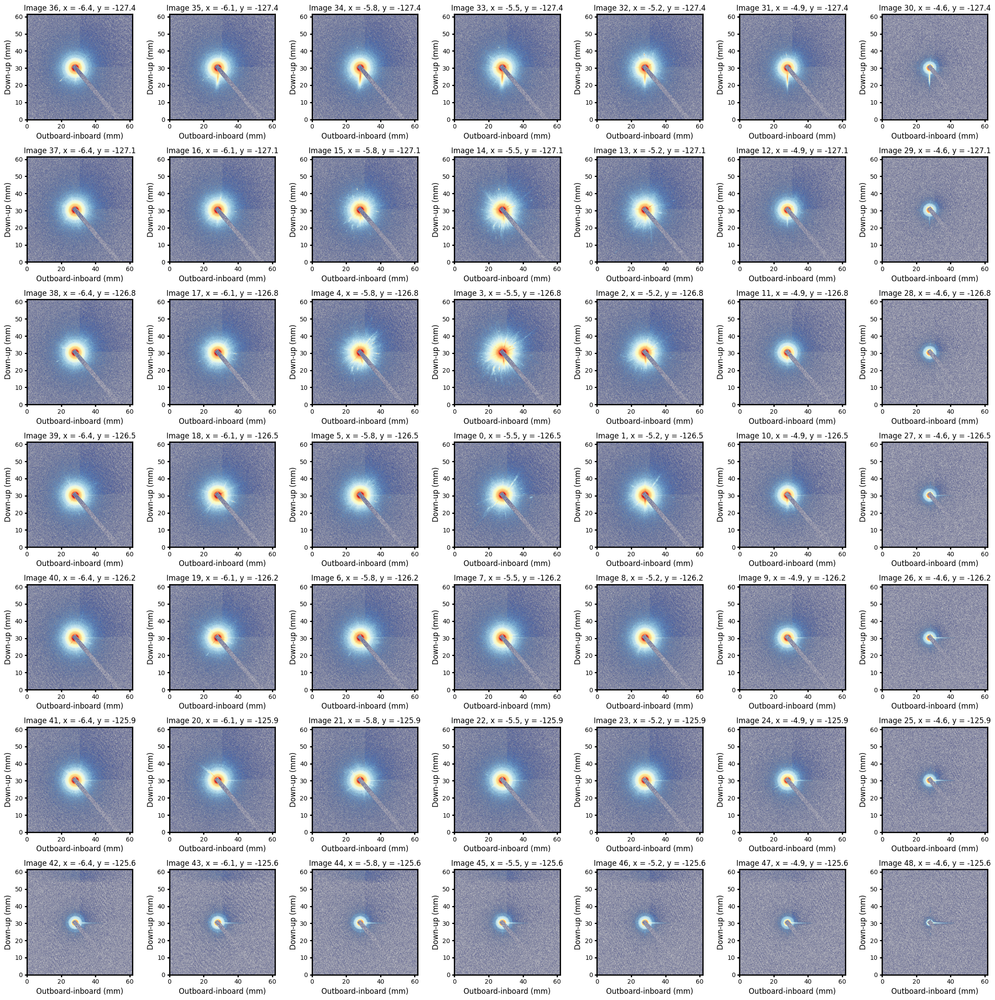

In [15]:
SCAN_ID_SPIRAL = 94399


scan_spiral = loader.loadRun(run=SCAN_ID_SPIRAL, dims=["sam_x","sam_y"]).unstack('system')

view_all_spiral_images(
    scan=scan_spiral,
    format = "matplotlib", 
    log_scale = True, 
    contrast_limits = [10, 1e5],
    # limits_inboard_outboard_down_up = [0, 61.7, 0, 61.4],
    )

#### View spirals reduced (I vs. q)

Optionally, the I vs. q plots for each spiral image can be viewed by azimuthally integrating the spiral images.  These plots may give a better sense of the scattering intensity in each image as well as show how artifacts in the images above might appear after azimuthal integration.

In [10]:
## Add x and y coordinates of the desired image
scan_spiral_single_image = scan_spiral.sel(sam_x=-7.4, sam_y=-4.9) ## TODO: figure out how to eliminate this step, as there already should be a mask at this point, and we just want to apply it to all images.
## Update the beam center 
BEAMCENTER = [474, 501]
## Update mask file path
FILE_PATH_MASK = r"BeamstopMask_Format_ScanID96389_20250807.msk"


## Add mask and azimuthally integrate scan (automated)
from PyHyperScattering.IntegrationUtils import DrawMask
mask = DrawMask(scan_spiral_single_image)
scan_to_integrate = phs.integrate.PFEnergySeriesIntegrator(geomethod='template_xr',template_xr = scan_spiral)
mask.load(FILE_PATH_MASK) ## Update mask file path
scan_to_integrate.mask = mask.mask
scan_to_integrate.npts=400
scan_to_integrate.ni_beamcenter_x = BEAMCENTER[0]
scan_to_integrate.ni_beamcenter_y = BEAMCENTER[1]
scan_azimuthally_integrated = scan_to_integrate.integrateImageStack(scan_spiral)

C:\Users\pmk\AppData\Local\miniforge3\envs\20250614_1\Lib\site-packages\PyHyperScattering\PFGeneralIntegrator.py:145: UserWarning: Since mask was none, creating an empty mask with shape (1024, 1026)
  self.calibrationFromTemplateXRParams(template_xr)
C:\Users\pmk\AppData\Local\miniforge3\envs\20250614_1\Lib\site-packages\PyHyperScattering\IntegrationUtils.py:184: FutureWarning: Passing literal json to 'read_json' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  dflist.append(pd.read_json(item))
100%|██████████████████████████████████████████████████████████████████████████████████| 49/49 [00:04<00:00, 10.08it/s]


Viewing spiral images for SBA15


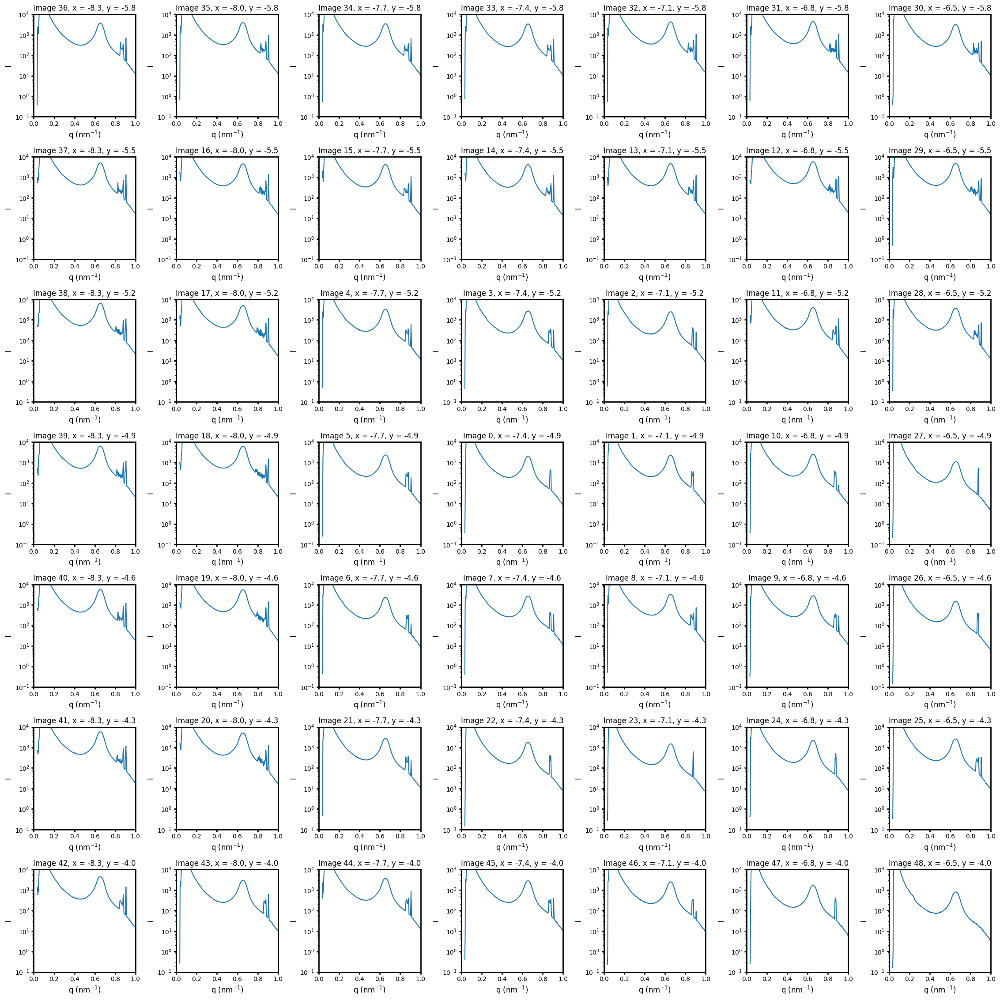

In [11]:
## View I vs. q plots for all spirals
view_all_spiral_I_vs_q(
    scan = scan_azimuthally_integrated,
    format = "matplotlib", 
    x_scale = "linear",
    y_scale = "log",
    limits_q_I = [0, 1, 1e-1, 1e4],
    )

#### View transmitted flux

In [ ]:
## TODO: use WAXS photodiode data to construct a heat map of transmitted flux at each location
## TODO: make a similar heat map using total scattered intensity to compare with the WAXS photodiode data

#### Pick optimal spot(s)

It is strongly recommended to pick at least 3 spots per sample to ensure repeatability and homogeneity across the sample.  For assistance in identifying what "good" spots look like, see the Guide to Picking Spiral Scans: https://wiki-nsls2.bnl.gov/beamline7ID1/index.php?title=Guide_to_Picking_Spiral_Scans.  More tips are included below.
- In the image itself, check that there is sufficient flux (e.g., the beam is not blocked by a sample substrate frame) and that the scattering appears circular and radially symmetric.  Avoid images with streaks or non-circular polygon shaped scattering.
- Using a combination of the image and photodiode signal, pick spots with appropriate flux.  What is considered appropriate flux depends on the specific sample.  See some examples below.
    - Simply going for the highest flux (highest photodiode signal) may not always be appropriate because it may come from a region where the sample is thin or absent.
    - If the sample was floated or microtomed, regions with low photodiode signal but strong scattering may come from a region where the sample film has folded onto itself.
- If possible, pick spots that are spatially far from each other to get good representation across the sample surface.  For sample, in the scan above, images 33, 42, and 48 might be good candidates.  If using a differnet viewer in which the images are not displayed by their spatial position, keep in mind that the due to the spiral shape of the scan, images that are sequentially far apart may still be spatially close together.

It is recommended to let spiral scans run to completion, as a full spiral may help identify potential heterogeneities in a sample that might inform future sample preparation or analysis.  However, if a sufficient number of spots are found before the spiral scan is complete, the spiral scan can be aborted and then the scan queue may be resumed, which will skip the partially-complete spiral scan and move onto the next scan to save time.

<br>

After deciding the images you want, update the sample positions using the code below.  First, load an up-to-date spreadsheet that was saved after fiducials were calibrated.  Then, use the `pick_locations_from_spirals` function to choose the desired locations.  In the `locations_selected_indices` input, use the image numbers that correspond to the sequential order in which scans were performed.  Finally, save the updated locations back into the spreadsheet, and use this new spreadsheet to run subsequent scans.  The first selected location will replace the original location of the sample that was clicked from the bar image.  Additional locations will be saved as additional samples with the original `sample_id` and an additional "_1", "_2", etc. at the end.

Be sure to switch back to `waxs_normal_mode()` in Bluesky before running non-spiral scans.

In [24]:
## Load a spreadsheet with up-to-date sample configuration

FILE_NAME_CONFIGURATION = r"in_2025-08-21_SpreadsheetTemplate.xlsx"
FILE_PATH_CONFIGURATION = r"G:/Shared drives/NISTPostdoc/CharacterizationData/BeamTime/20250528_SST1_Commissioning/"

configuration = load_configuration_spreadsheet_local(os.path.join(FILE_PATH_CONFIGURATION, FILE_NAME_CONFIGURATION)) 

Error evaluating carbon_NEXAFS: malformed node or string on line 1: <ast.Name object at 0x00000240A9EBAE10>
Error evaluating oxygen_NEXAFS: malformed node or string on line 1: <ast.Name object at 0x00000240A3537C90>
Error evaluating nitrogen_NEXAFS: malformed node or string on line 1: <ast.Name object at 0x00000240A9EBAC90>
Error evaluating carbon_NEXAFS: malformed node or string on line 1: <ast.Name object at 0x00000240A3537490>
Error evaluating carbon_NEXAFS: malformed node or string on line 1: <ast.Name object at 0x00000240A9EB8ED0>
Error evaluating carbon_RSoXS: malformed node or string on line 1: <ast.Name object at 0x00000240A3537C90>
Error evaluating oxygen_RSoXS: malformed node or string on line 1: <ast.Name object at 0x00000240A9EBAE10>
Error evaluating nitrogen_RSoXS: malformed node or string on line 1: <ast.Name object at 0x00000240A3537490>


In [25]:
## Repeat the block of code for each sample

SCAN_ID_SPIRAL = 94390
scan_spiral = loader.loadRun(run=SCAN_ID_SPIRAL, dims=["time"]).unstack('system')
configuration = pick_locations_from_spirals(
    sample_id="SBA15",
    locations_selected_indices=[0, 30, 36],
    scan_spiral=scan_spiral,
    configuration=configuration,
)

C:\Users\pmk\AppData\Local\miniforge3\envs\20250614_1\Lib\site-packages\PyHyperScattering\SST1RSoXSDB.py:596: UserWarning: 
Wide Angle CCD Detector is reported as underexposed
at one or more energies per definitions here:
https://github.com/NSLS-II-SST/rsoxs/blob/10c2c41b695c1db552f62decdde571472b71d981/rsoxs/Base/detectors.py#L110-L119
Wide Angle CCD Detector is reported as underexposed at all energies.
  md = self.loadMd(run)
C:\Users\pmk\AppData\Local\Temp\1\ipykernel_19768\4218460288.py:4: UserWarning: Monitor streams loaded successfully, but could not be correlated to images.  Check monitor stream for issues, probable metadata change.
  scan_spiral = loader.loadRun(run=SCAN_ID_SPIRAL, dims=["time"]).unstack('system')


In [26]:
## Save new spreadsheet
save_configuration_spreadsheet_local(configuration=configuration, file_label="SpiralSpotsPicked", file_path=FILE_PATH_CONFIGURATION)

## View raw 1D detectors (e.g., NEXAFS scans)

In [ ]:
## TODO: plot all detectors on separate subplots so that raw data can be viewed

## View 2D detector (e.g., RSoXS scans)